# ALZHEIMER CLASSIFICATION

## Import Libraries

In [1]:
!pip install nipype
!pip install nibabel scipy
!apt-get update -y
!apt-get install fsl -y

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.2/3.2 MB 33.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 421.5/421.5 kB 27.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 528.1/528.1 kB 34.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 137.9/137.9 kB 10.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 5.1/5.1 MB 58.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 43.2/43.2 kB 2.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 41.7/41.7 kB 2.7 MB/s eta 0:00:00
Get:1 https://developer.download.nvidia.com/compute/cuda/repos/ubuntu2204/x86_64  InRelease [1581 B]
Get:2 https://packages.cloud.google.com/apt gcsfuse-focal InRelease [1227 B]
Get:3 https://packages.cloud.google.com/apt cloud-sdk InRelease [1618 B]
Hit:4 http://archive.ubuntu.com/ubuntu jammy InRelease
Get:5 http://security.ubuntu.com/ubuntu jammy-security InRelease [129 kB]
Get:6 https://packages.cloud.google.com/apt google-fast-socket InRe

In [2]:
import os
import zipfile
import numpy as np
import tensorflow as tf  
import nibabel as nib
from scipy import ndimage
import keras
from keras import layers
import os
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np
from skimage import transform
import nibabel as nib
import random
from scipy import ndimage
from nipype.interfaces import fsl
from skimage.filters import threshold_multiotsu as MultiOtsu
from tensorflow.keras.preprocessing.image import ImageDataGenerator

## Loading Data

In [3]:
#from google.colab import drive
#drive.mount('/content/drive')

In [4]:
AD_paths = [
    os.path.join(os.getcwd(), "/kaggle/input/adni-3t-80/AD_80", x)
    for x in os.listdir("/kaggle/input/adni-3t-80/AD_80")
]

CN_paths = [
    os.path.join(os.getcwd(), "/kaggle/input/adni-3t-80/CN_80", x)
    for x in os.listdir("/kaggle/input/adni-3t-80/CN_80")
]

MCI_paths = [
    os.path.join(os.getcwd(), "/kaggle/input/adni-3t-80/MCI_80", x)
    for x in os.listdir("/kaggle/input/adni-3t-80/MCI_80")
]

AD_raw_paths = [
    os.path.join(os.getcwd(), "/kaggle/input/adni3t/AD50/AD50", x)
    for x in os.listdir("/kaggle/input/adni3t/AD50/AD50")
]

CN_raw_paths = [
    os.path.join(os.getcwd(), "/kaggle/input/adni3t/CN50/CN50", x)
    for x in os.listdir("/kaggle/input/adni3t/CN50/CN50")
]

MCI_raw_paths = [
    os.path.join(os.getcwd(), "/kaggle/input/adni3t/MCI50/MCI50", x)
    for x in os.listdir("/kaggle/input/adni3t/MCI50/MCI50")
]
print("AD: " + str(len(AD_paths)))
print("CN: " + str(len(CN_paths)))
print("MCI: " + str(len(MCI_paths)))
print("AD_RAW: " + str(len(AD_raw_paths)))
print("CN_RAW: " + str(len(CN_raw_paths)))
print("MCI_RAW: " + str(len(MCI_raw_paths)))

AD: 80
CN: 80
MCI: 80
AD_RAW: 50
CN_RAW: 50
MCI_RAW: 50


Processing file: AD_23.nii


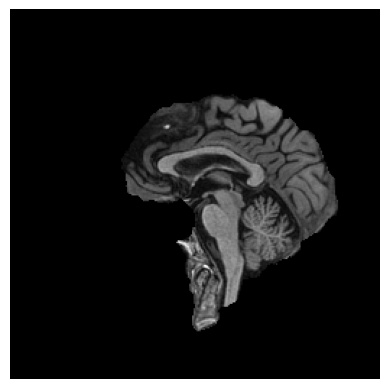

Processing file: AD_57.nii


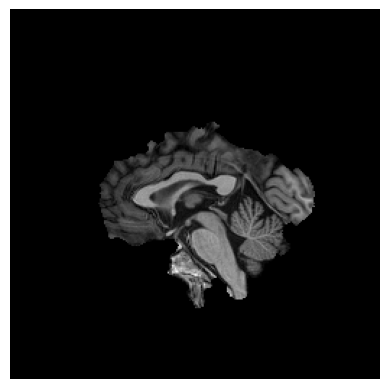

Processing file: AD_46.nii


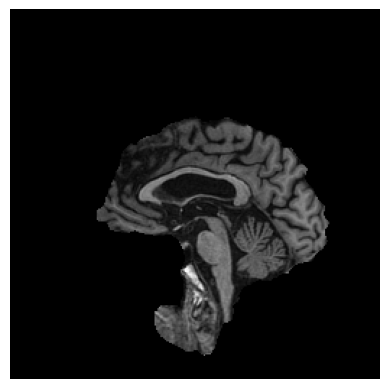

Processing file: AD_54.nii


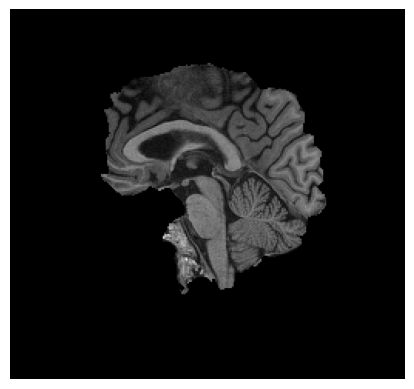

Processing file: AD_77.nii


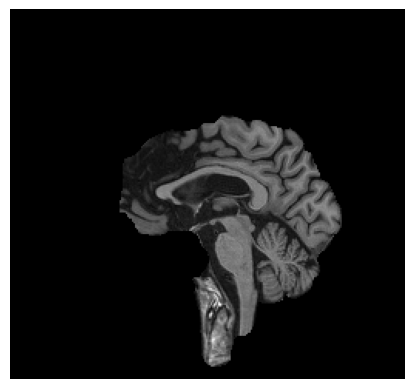

Processing file: AD_66.nii


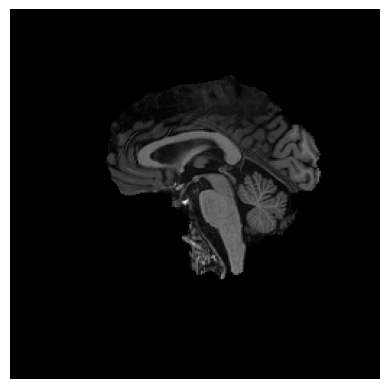

Processing file: AD_55.nii


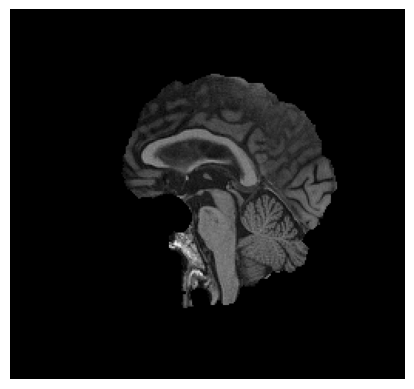

Processing file: AD_20.nii


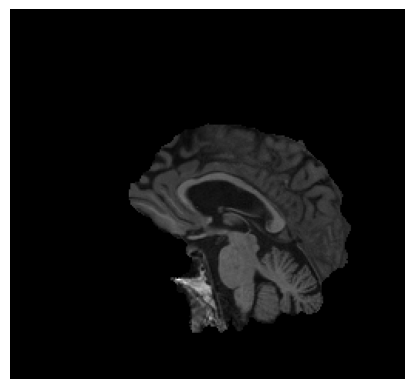

Processing file: AD_48.nii


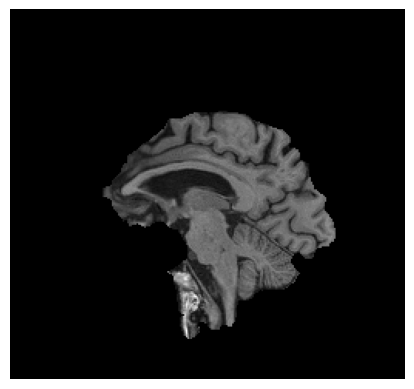

Processing file: AD_33.nii


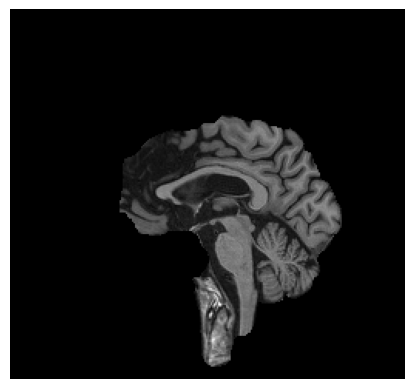

Processing file: AD_59.nii


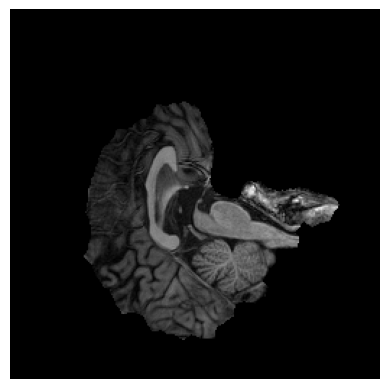

Processing file: AD_17.nii


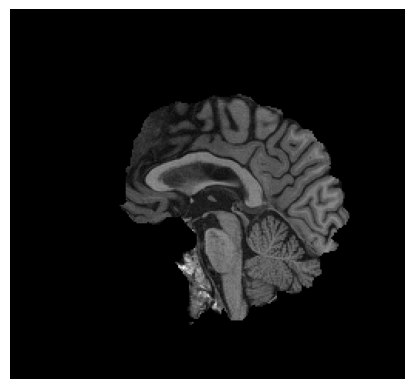

Processing file: AD_65.nii


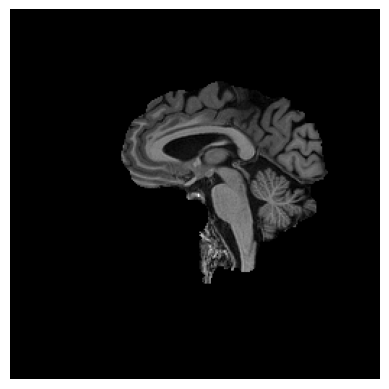

Processing file: AD_63.nii


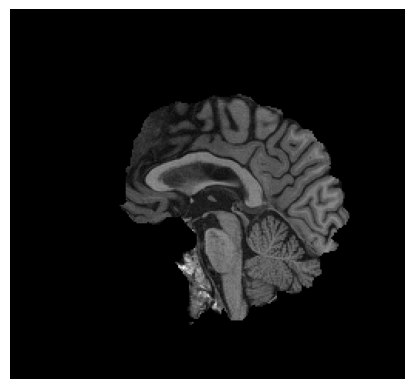

Processing file: AD_76.nii


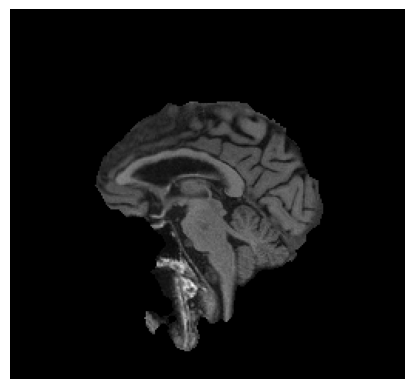

Processing file: AD_39.nii


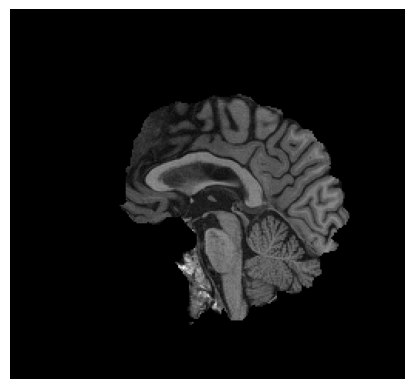

Processing file: AD_27.nii


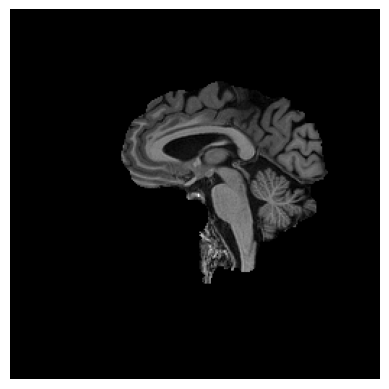

Processing file: AD_72.nii


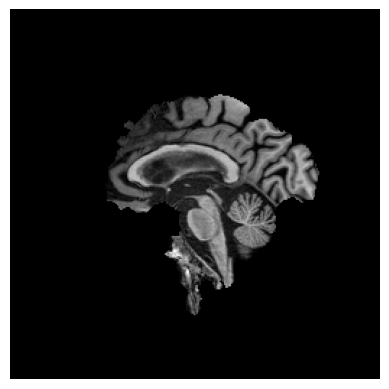

Processing file: AD_37.nii


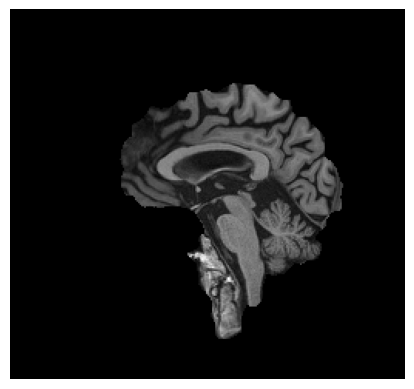

Processing file: AD_64.nii


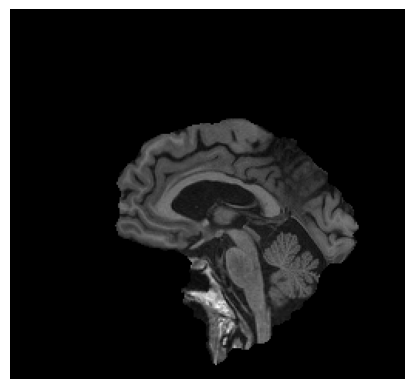

Processing file: AD_56.nii


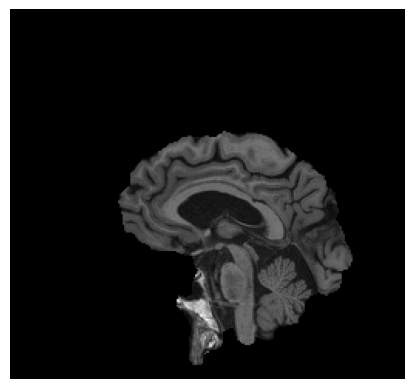

Processing file: AD_70.nii


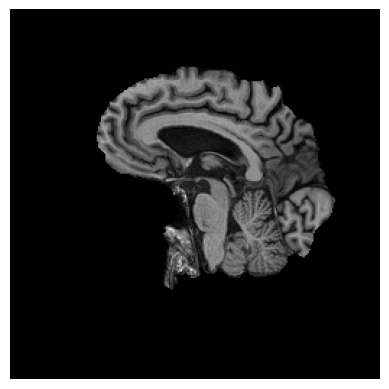

Processing file: AD_1.nii


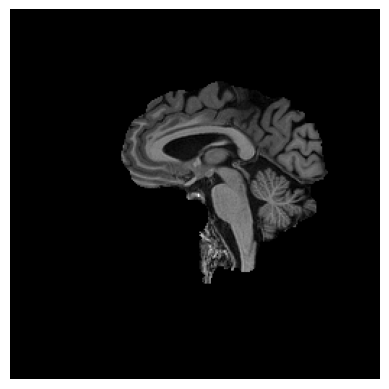

Processing file: AD_43.nii


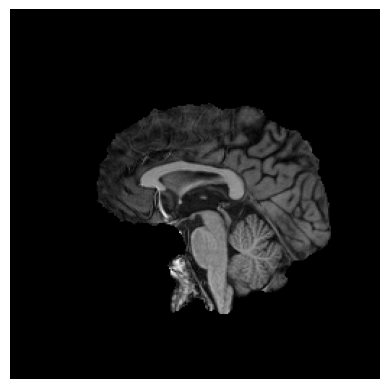

Processing file: AD_50.nii


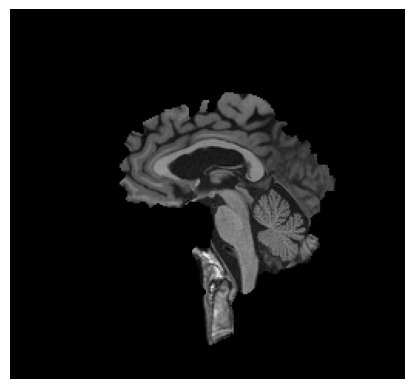

Processing file: AD_51.nii


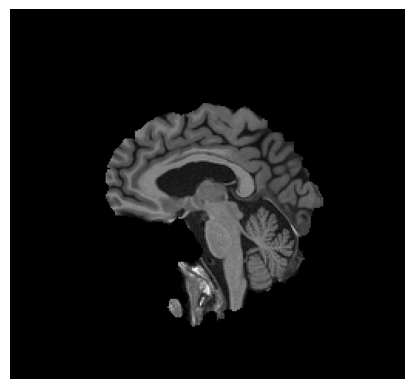

Processing file: AD_45.nii


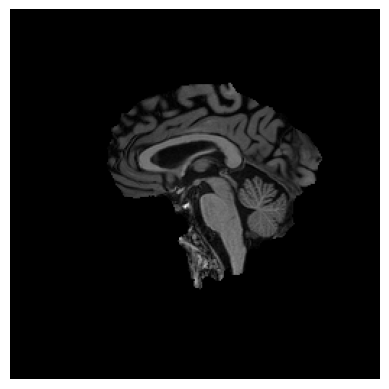

Processing file: AD_22.nii


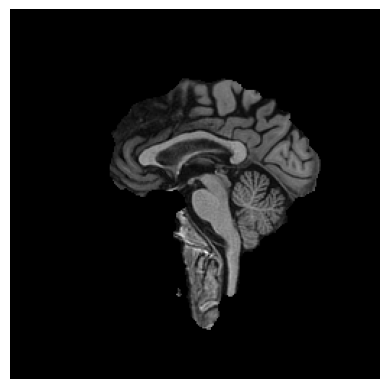

Processing file: AD_42.nii


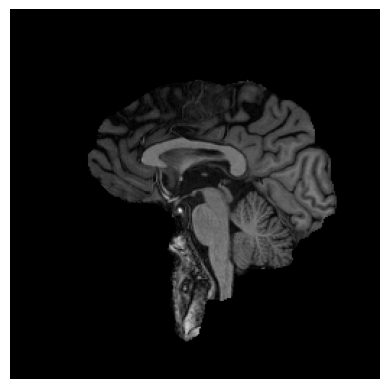

Processing file: AD_34.nii


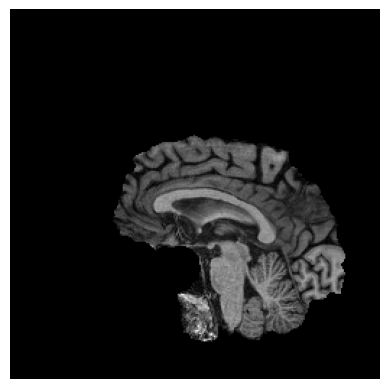

Processing file: AD_53.nii


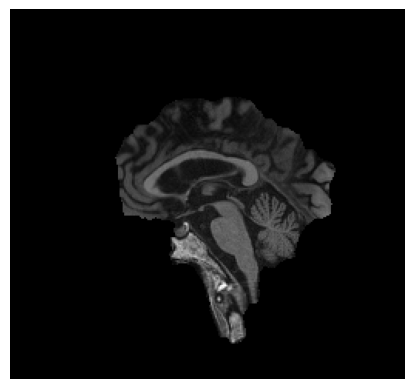

Processing file: AD_79.nii


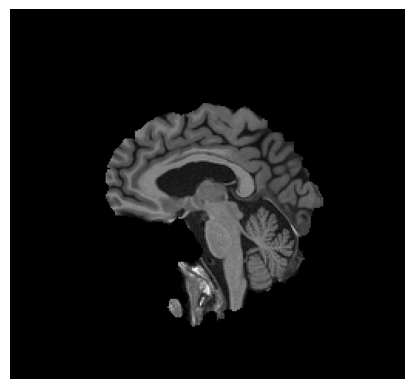

Processing file: AD_11.nii


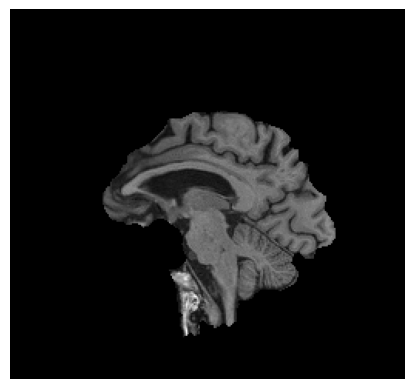

Processing file: AD_26.nii


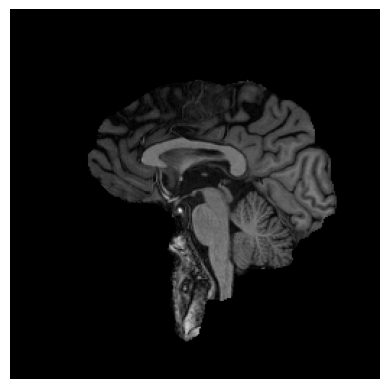

Processing file: AD_62.nii


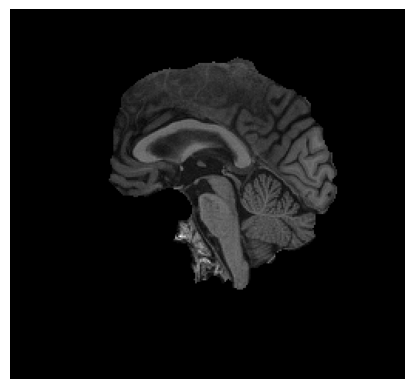

Processing file: AD_19.nii


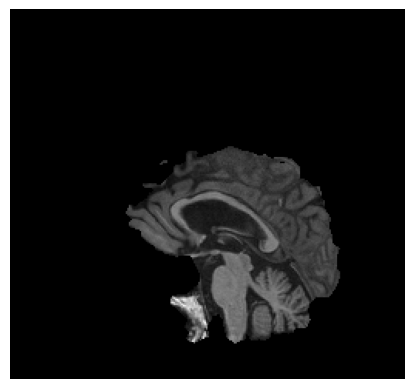

Processing file: AD_4.nii


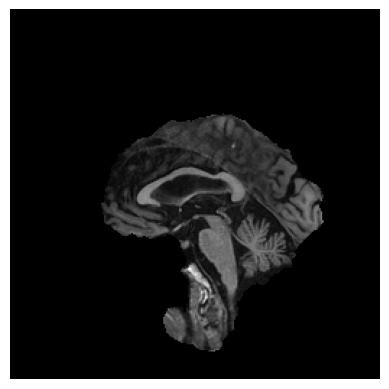

Processing file: AD_52.nii


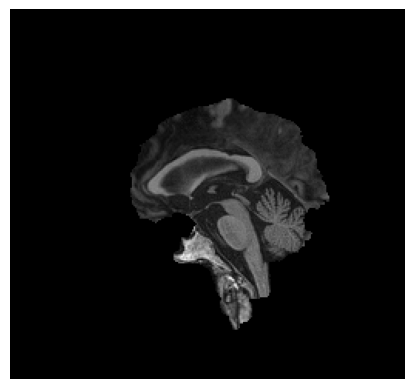

Processing file: AD_75.nii


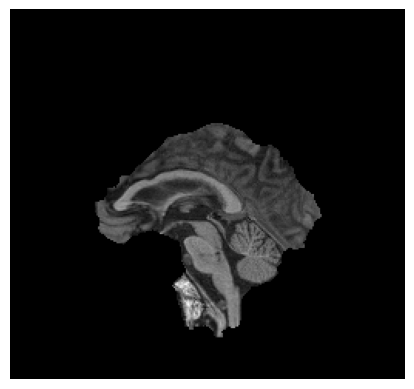

Processing file: AD_69.nii


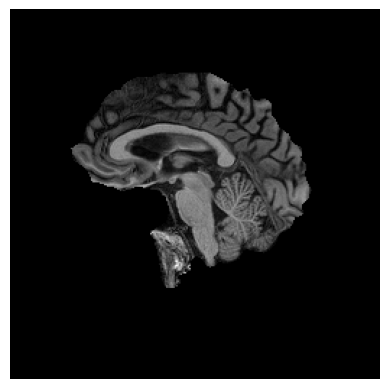

Processing file: AD_67.nii


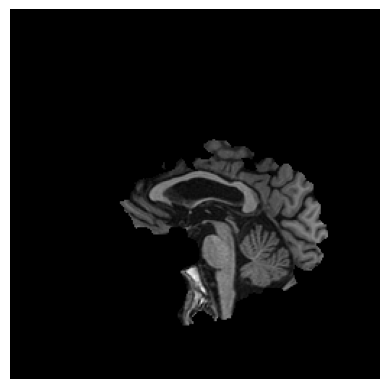

Processing file: AD_71.nii


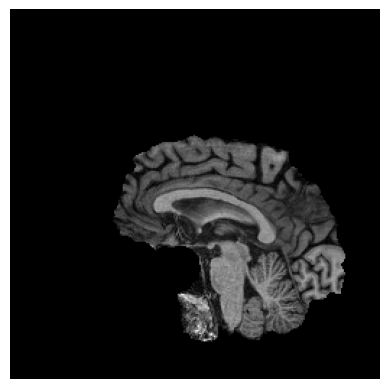

Processing file: AD_18.nii


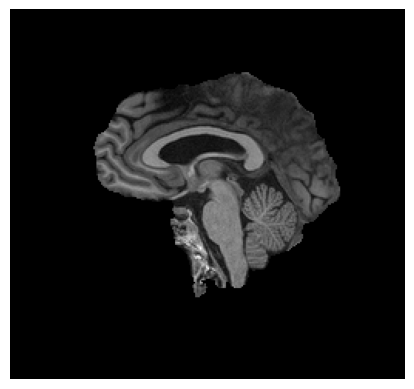

Processing file: AD_13.nii


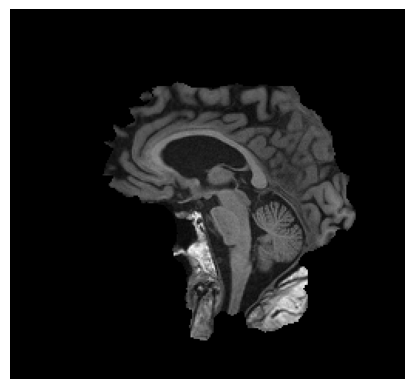

Processing file: AD_24.nii


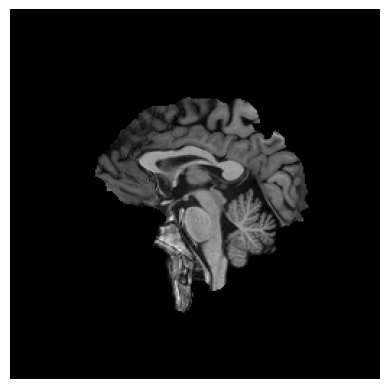

Processing file: AD_60.nii


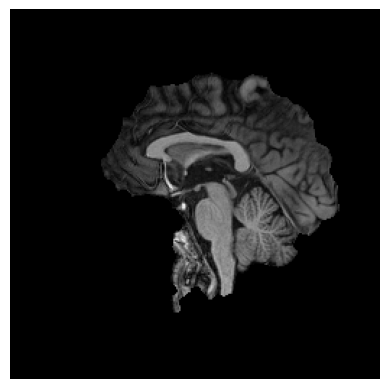

Processing file: AD_21.nii


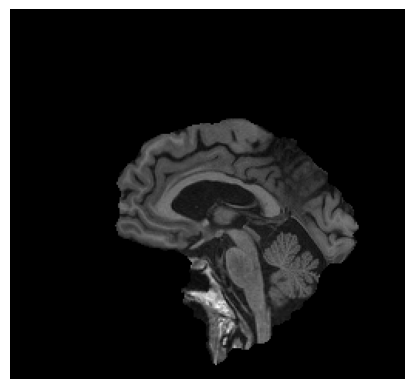

Processing file: AD_14.nii


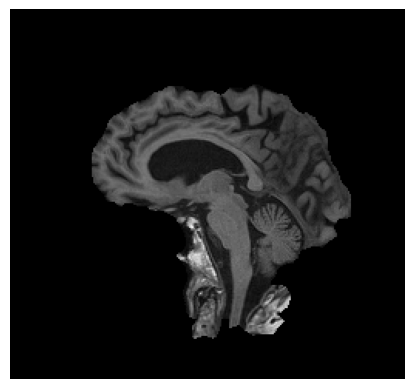

Processing file: AD_25.nii


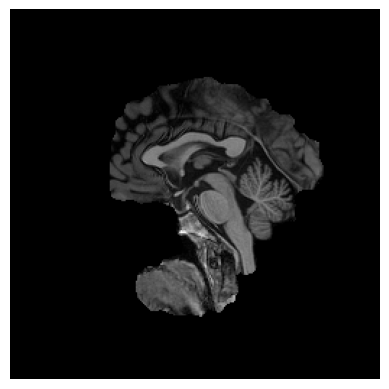

Processing file: AD_30.nii


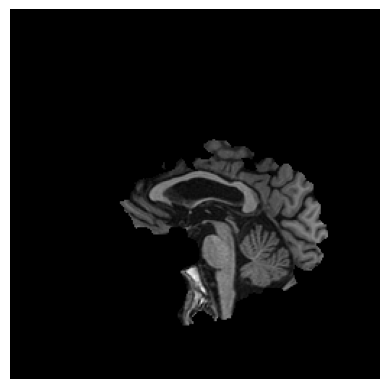

Processing file: AD_9.nii


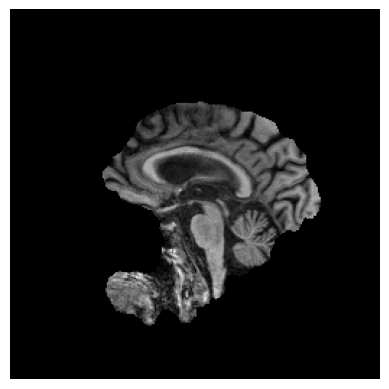

Processing file: AD_31.nii


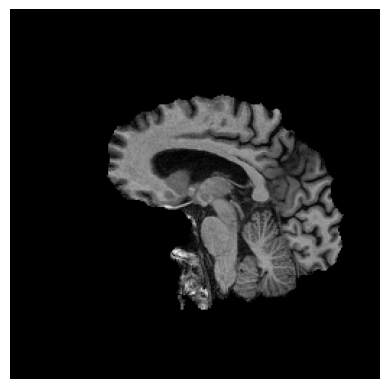

Processing file: AD_29.nii


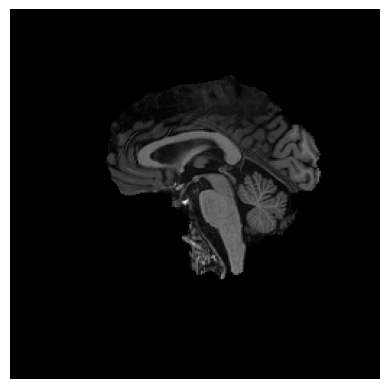

Processing file: AD_8.nii


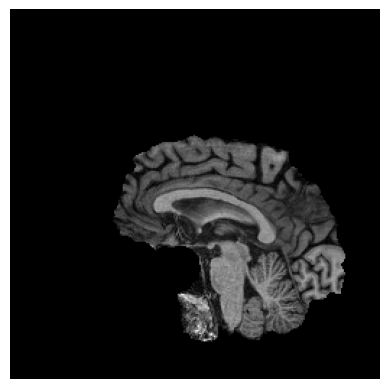

Processing file: AD_49.nii


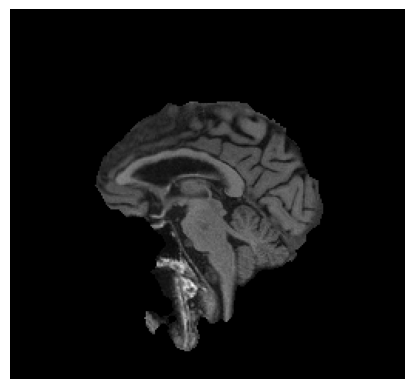

Processing file: AD_38.nii


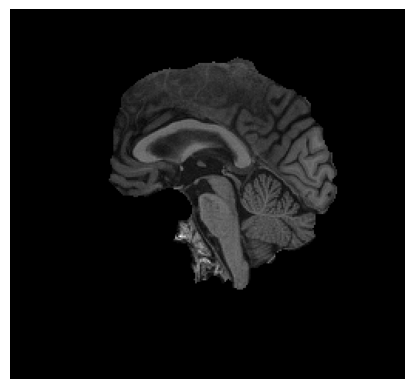

Processing file: AD_10.nii


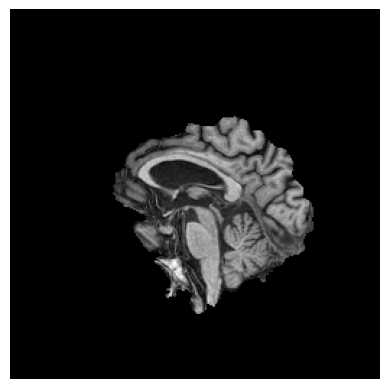

Processing file: AD_36.nii


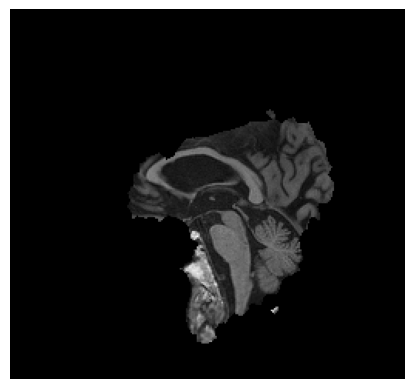

Processing file: AD_41.nii


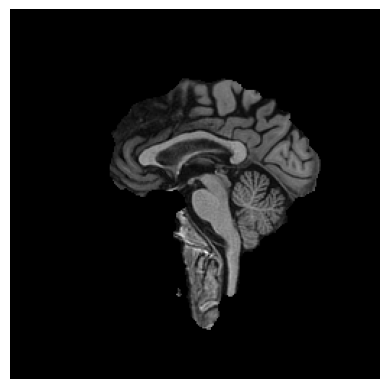

Processing file: AD_28.nii


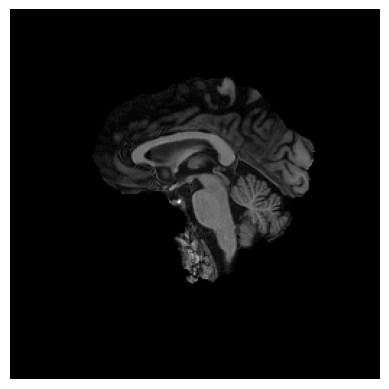

Processing file: AD_47.nii


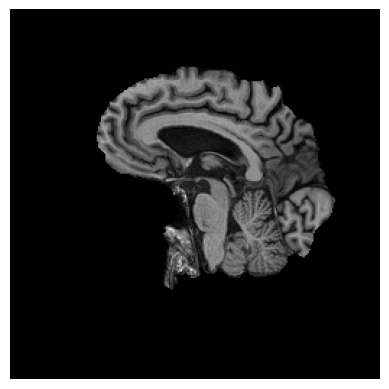

Processing file: AD_80.nii


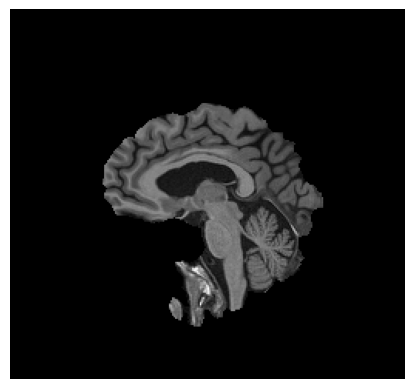

Processing file: AD_35.nii


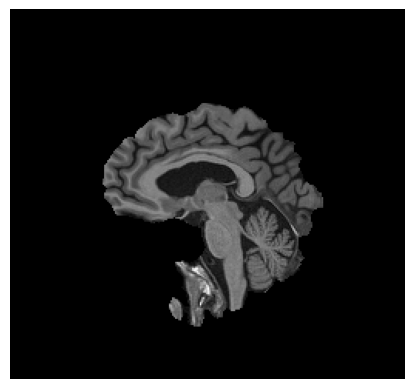

Processing file: AD_73.nii


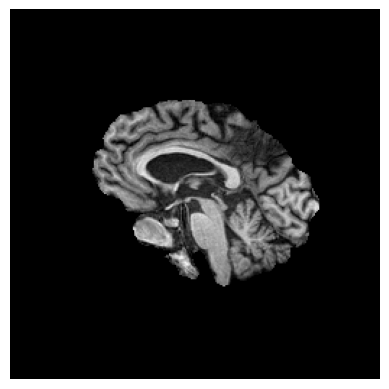

Processing file: AD_68.nii


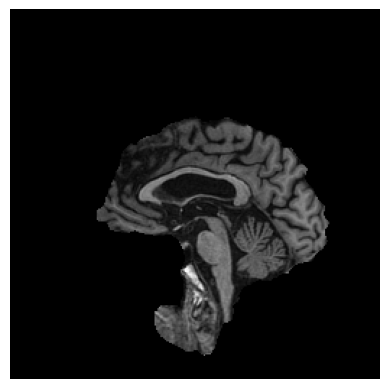

Processing file: AD_6.nii


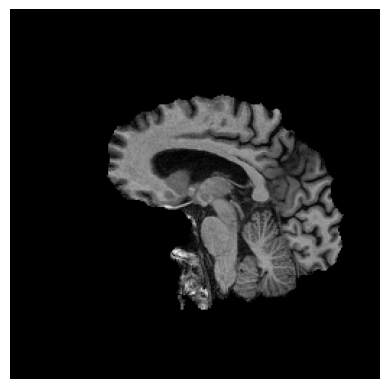

Processing file: AD_78.nii


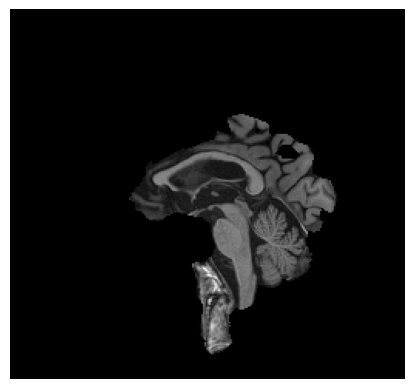

Processing file: AD_44.nii


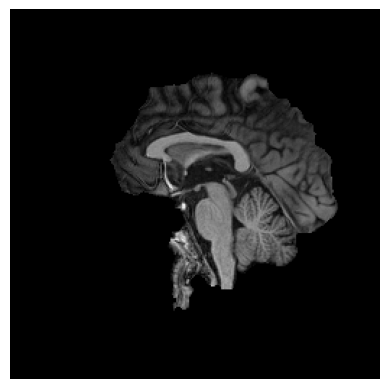

Processing file: AD_3.nii


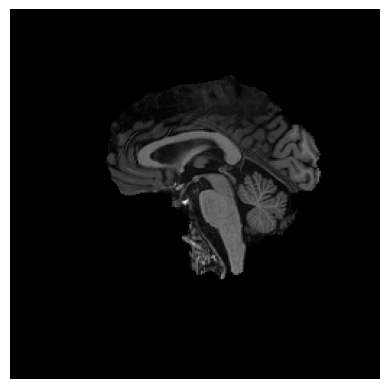

Processing file: AD_15.nii


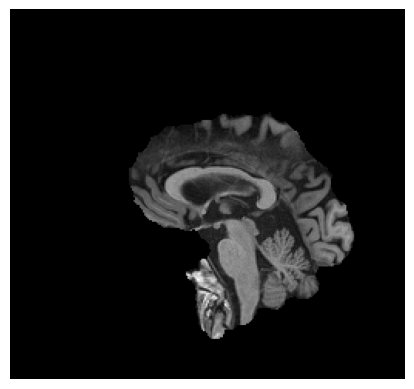

Processing file: AD_5.nii


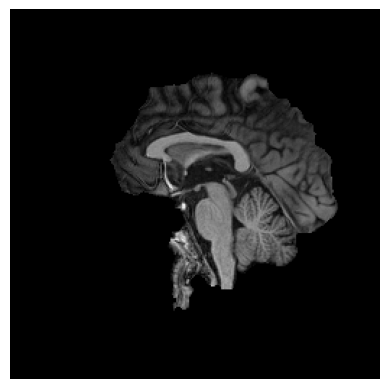

Processing file: AD_61.nii


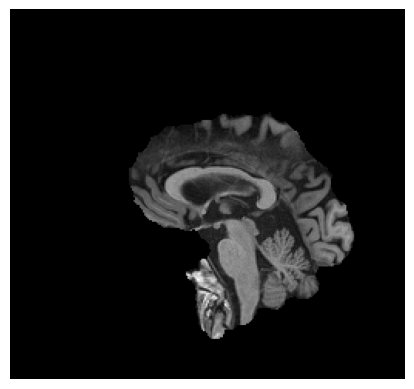

Processing file: AD_40.nii


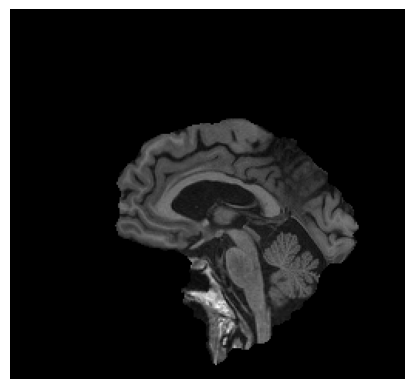

Processing file: AD_32.nii


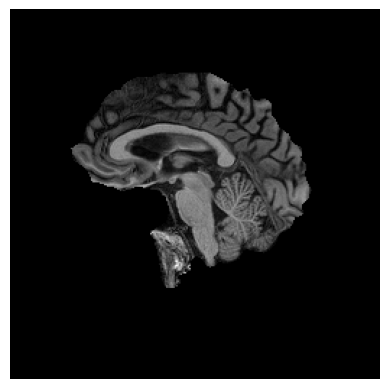

Processing file: AD_58.nii


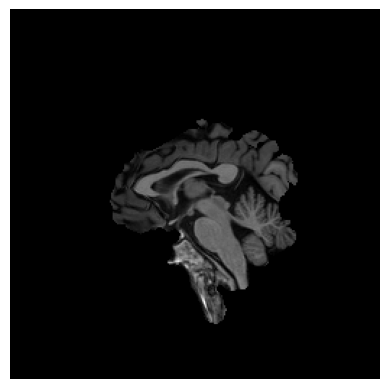

Processing file: AD_16.nii


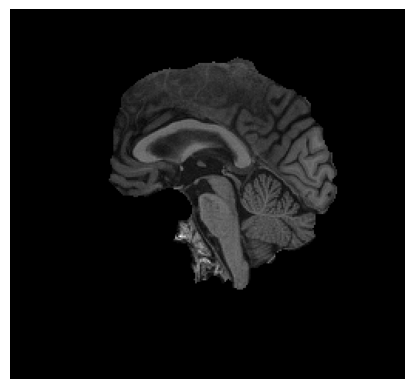

Processing file: AD_2.nii


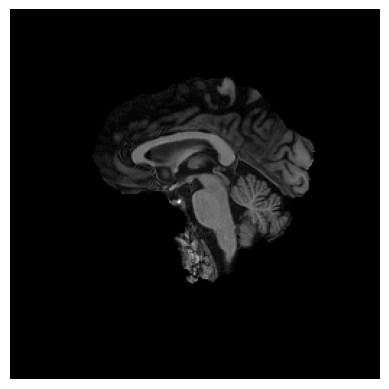

Processing file: AD_7.nii


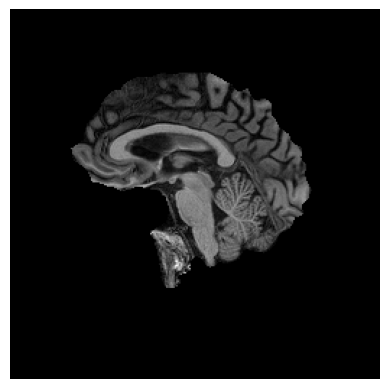

Processing file: AD_12.nii


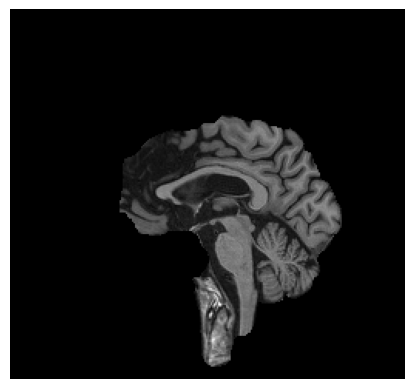

Processing file: AD_74.nii


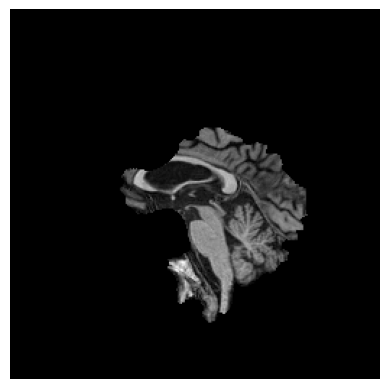

Processing file: MCI_54.nii


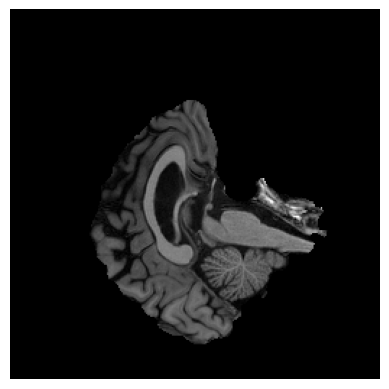

Processing file: MCI_69.nii


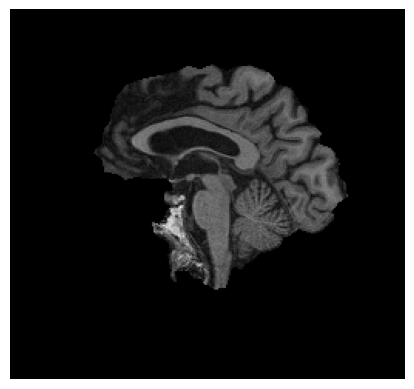

Processing file: MCI_19.nii


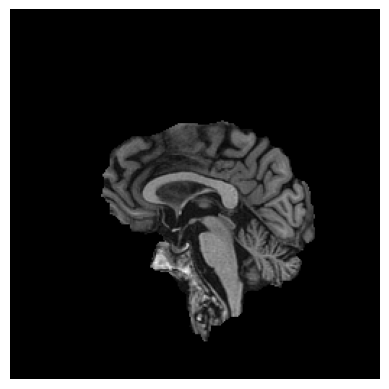

Processing file: MCI_15.nii


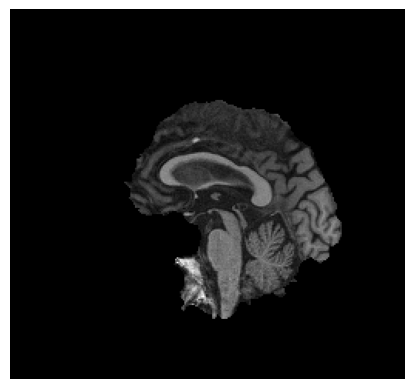

Processing file: MCI_11.nii


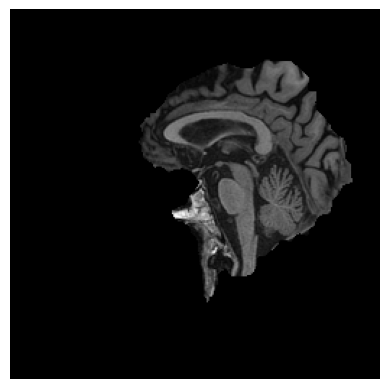

Processing file: MCI_66.nii


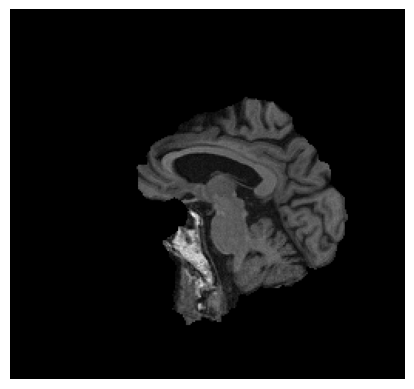

Processing file: MCI_35.nii


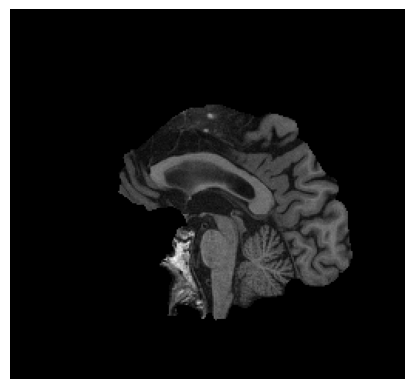

Processing file: MCI_10.nii


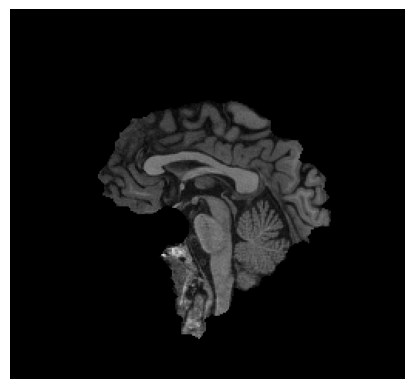

Processing file: MCI_64.nii


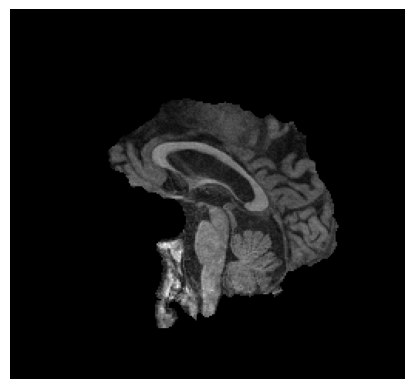

Processing file: MCI_39.nii


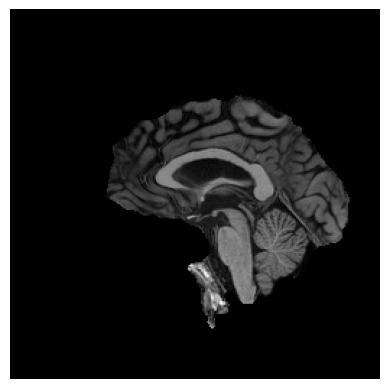

Processing file: MCI_80.nii


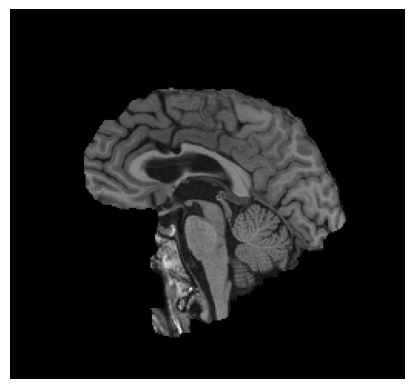

Processing file: MCI_8.nii


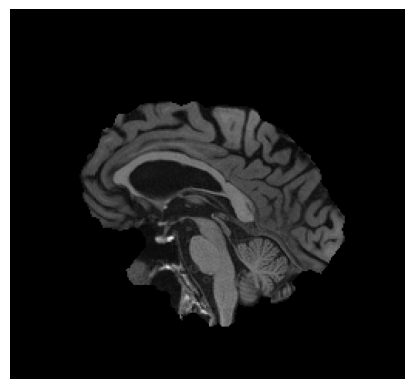

Processing file: MCI_77.nii


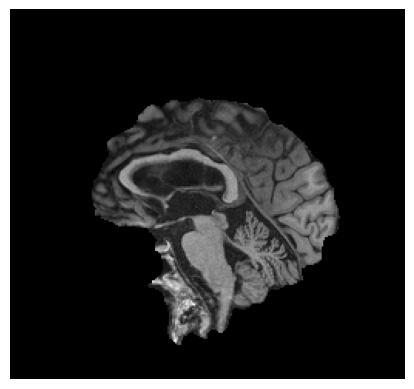

Processing file: MCI_24.nii


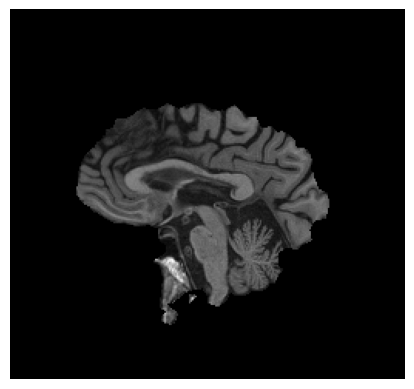

Processing file: MCI_79.nii


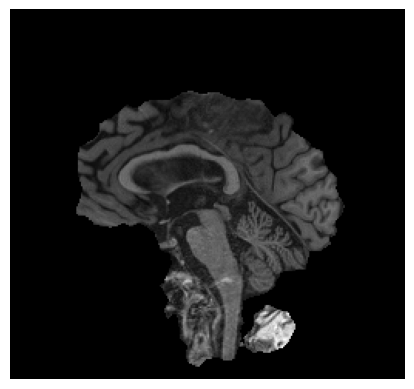

Processing file: MCI_17.nii


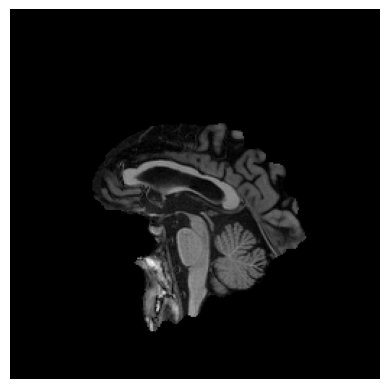

Processing file: MCI_38.nii


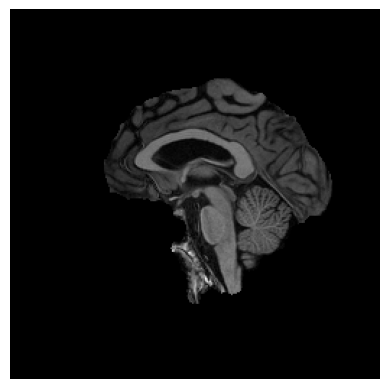

Processing file: MCI_2.nii


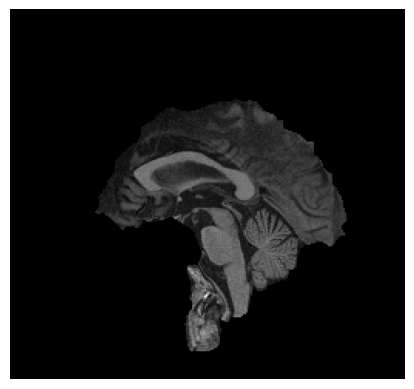

Processing file: MCI_68.nii


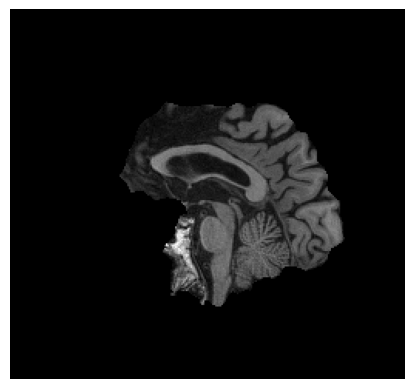

Processing file: MCI_45.nii


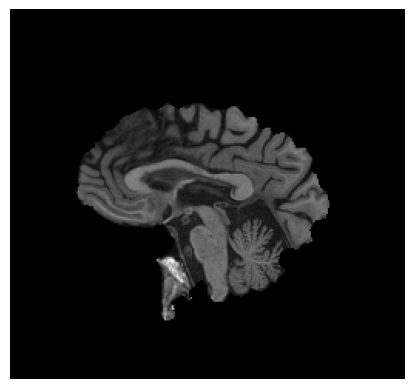

Processing file: MCI_37.nii


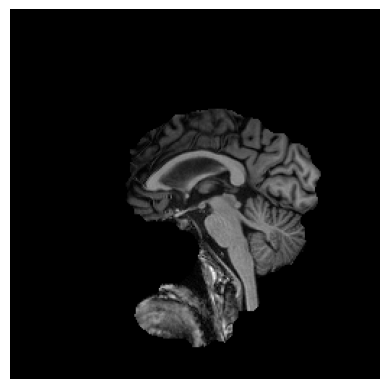

Processing file: MCI_40.nii


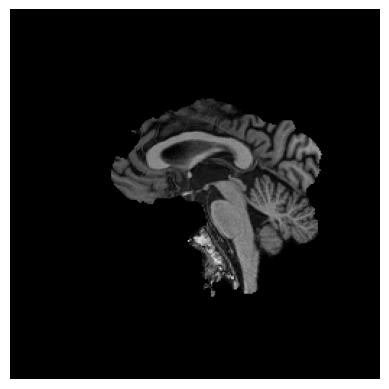

Processing file: MCI_28.nii


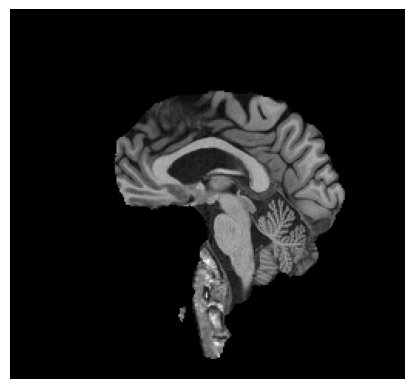

Processing file: MCI_51.nii


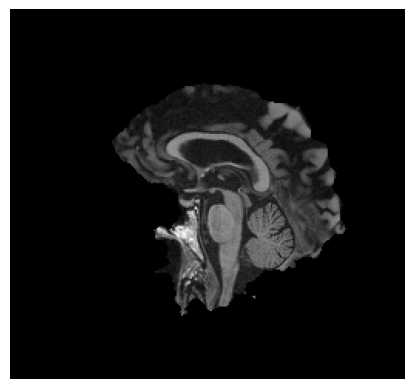

Processing file: MCI_74.nii


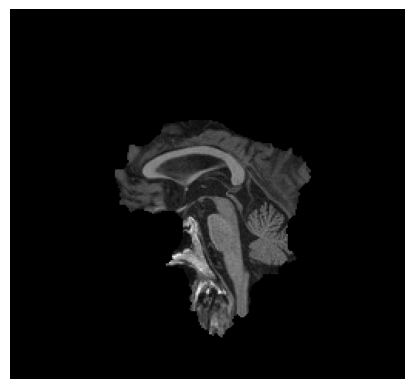

Processing file: MCI_26.nii


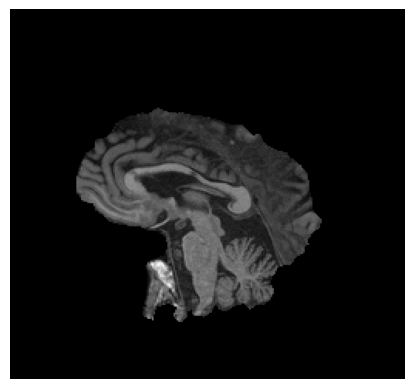

Processing file: MCI_33.nii


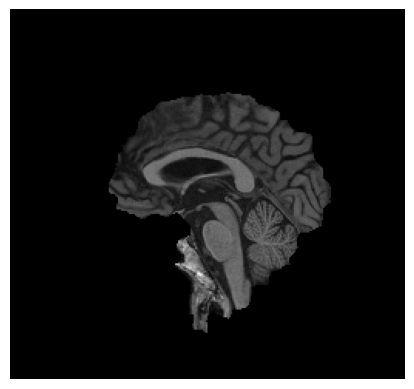

Processing file: MCI_31.nii


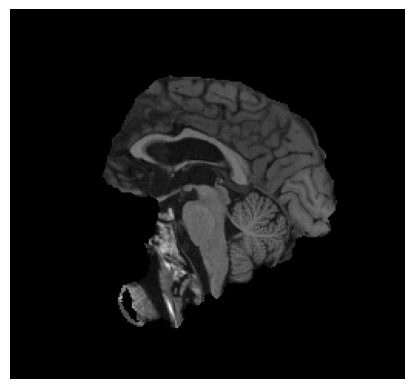

Processing file: MCI_5.nii


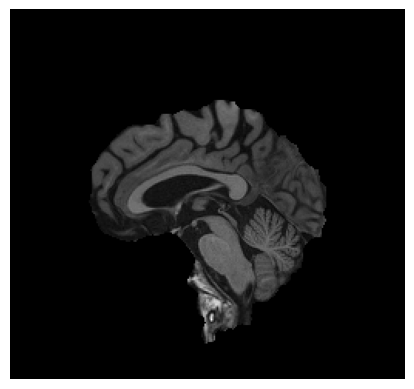

Processing file: MCI_55.nii


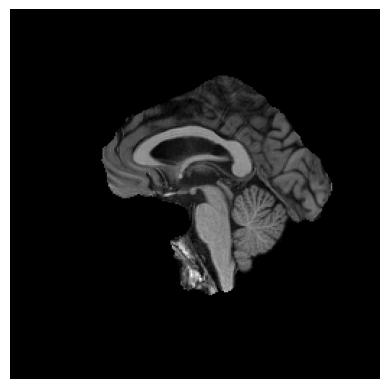

Processing file: MCI_44.nii


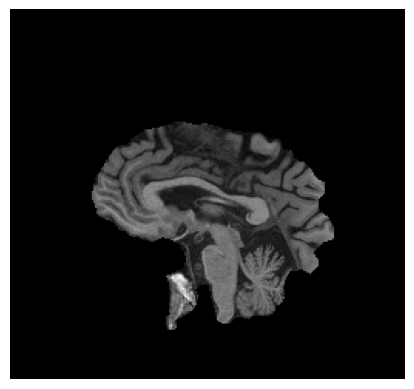

Processing file: MCI_25.nii


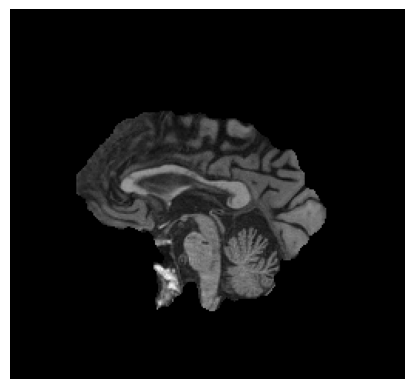

Processing file: MCI_27.nii


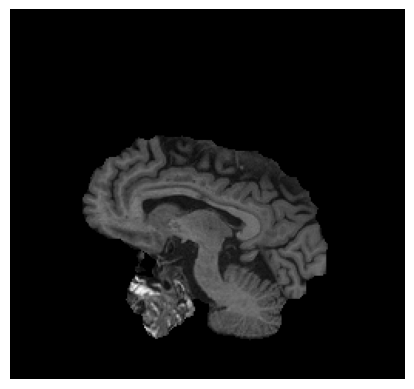

Processing file: MCI_18.nii


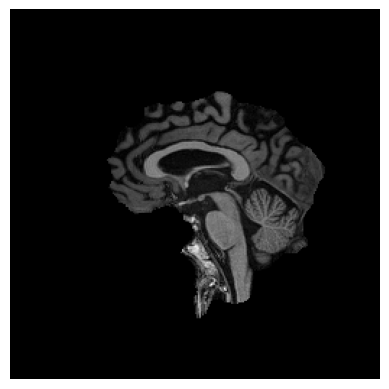

Processing file: MCI_41.nii


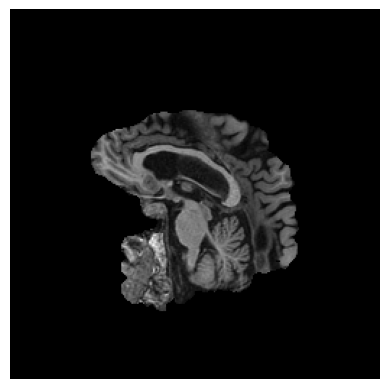

Processing file: MCI_3.nii


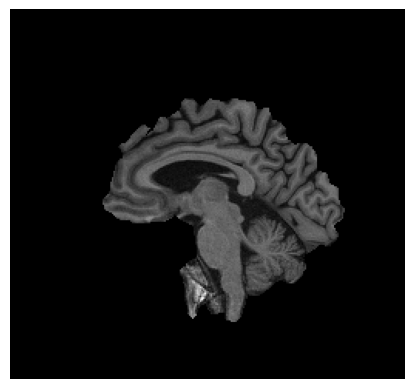

Processing file: MCI_65.nii


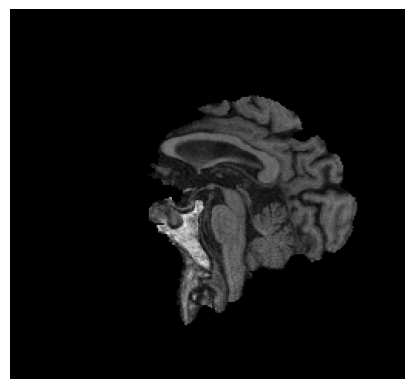

Processing file: MCI_32.nii


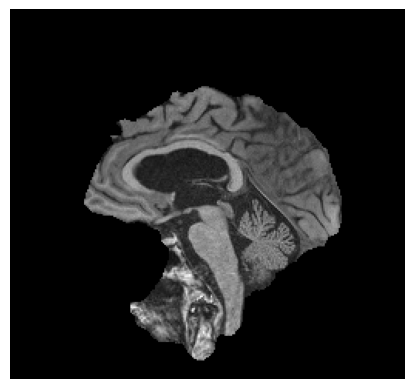

Processing file: MCI_29.nii


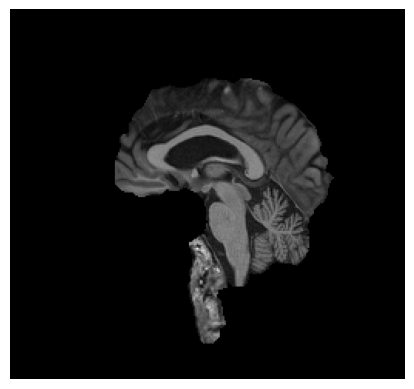

Processing file: MCI_36.nii


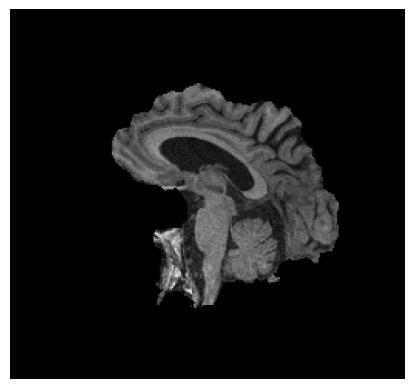

Processing file: MCI_59.nii


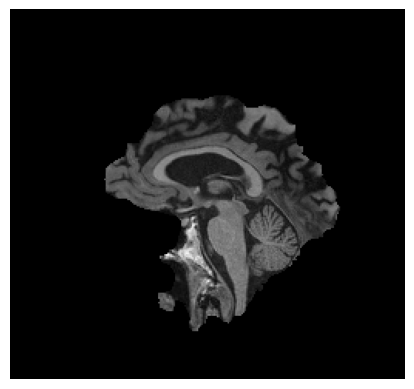

Processing file: MCI_56.nii


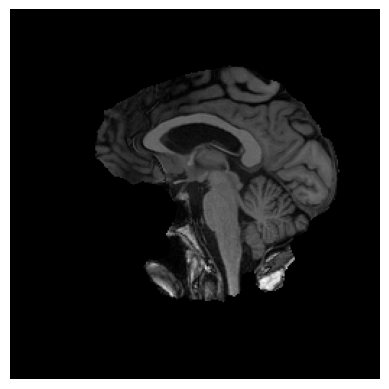

Processing file: MCI_62.nii


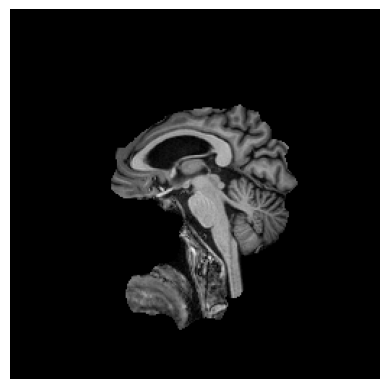

Processing file: MCI_46.nii


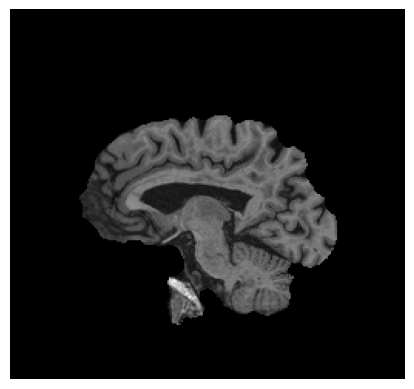

Processing file: MCI_7.nii


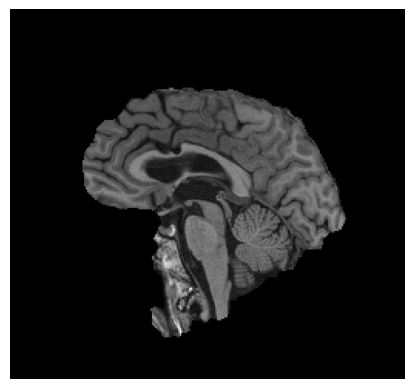

Processing file: MCI_72.nii


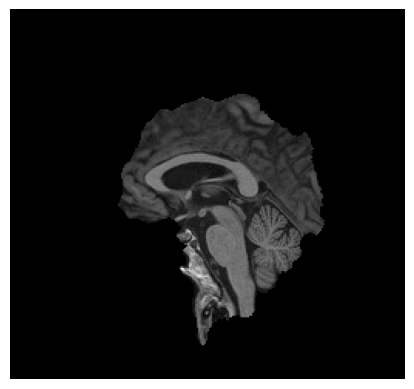

Processing file: MCI_76.nii


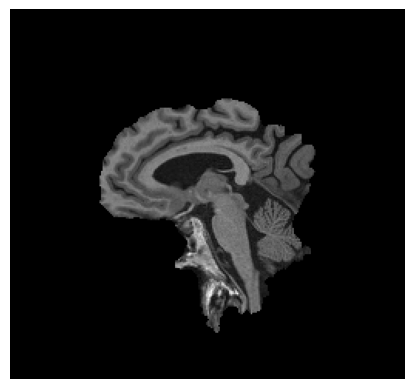

Processing file: MCI_48.nii


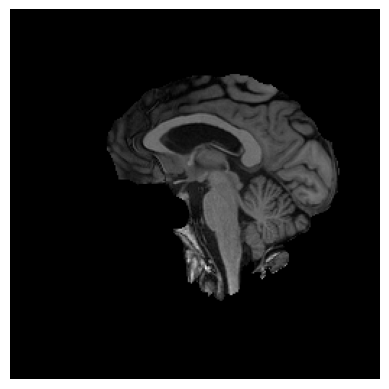

Processing file: MCI_78.nii


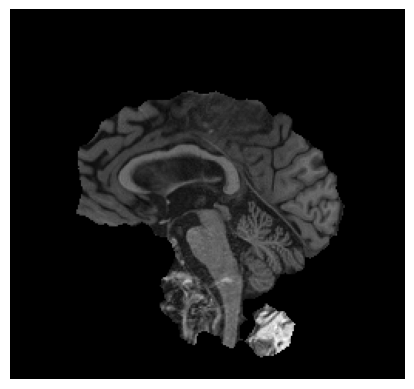

Processing file: MCI_6.nii


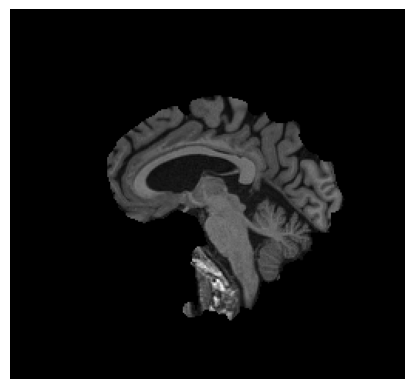

Processing file: MCI_57.nii


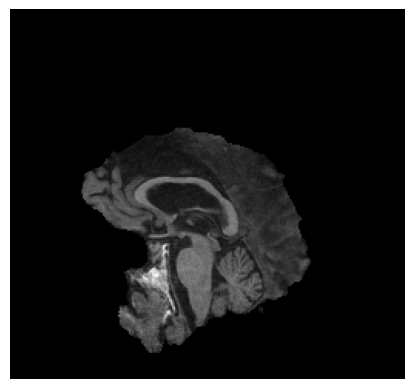

Processing file: MCI_52.nii


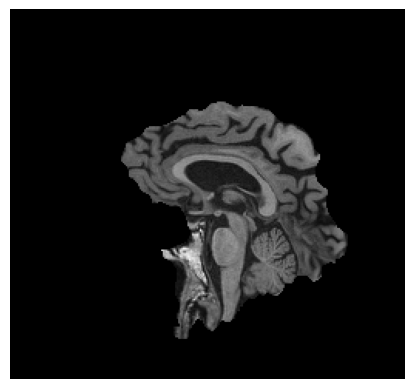

Processing file: MCI_53.nii


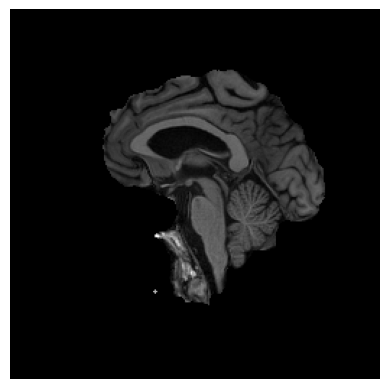

Processing file: MCI_43.nii


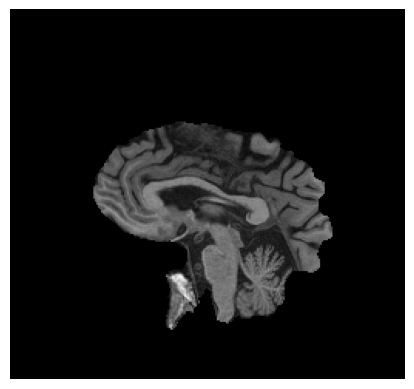

Processing file: MCI_71.nii


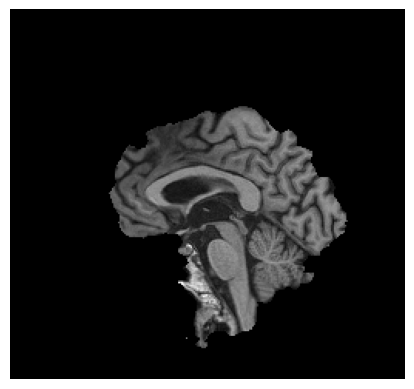

Processing file: MCI_67.nii


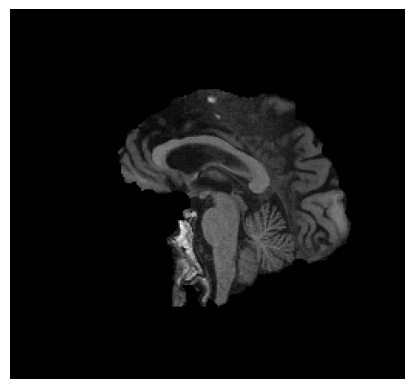

Processing file: MCI_73.nii


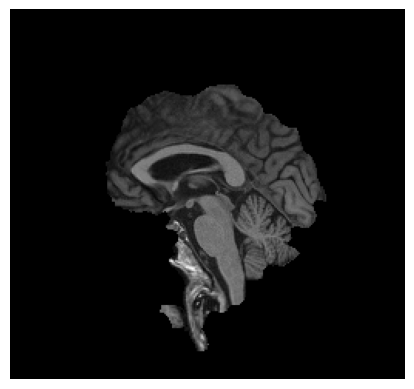

Processing file: MCI_63.nii


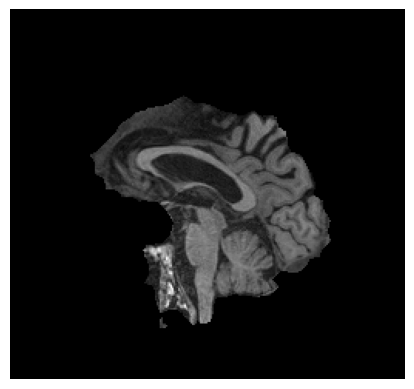

Processing file: MCI_22.nii


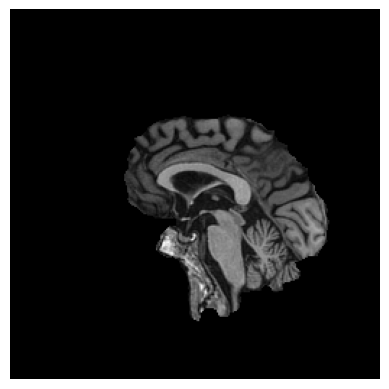

Processing file: MCI_47.nii


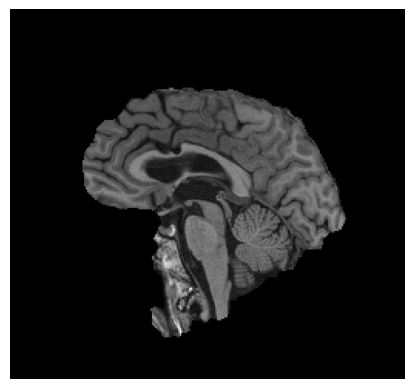

Processing file: MCI_9.nii


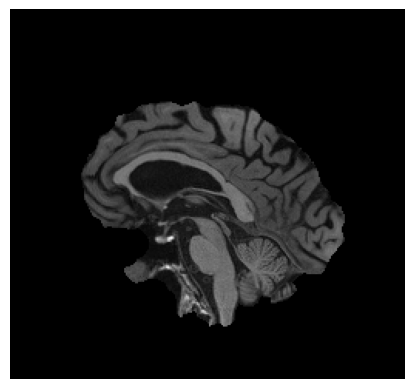

Processing file: MCI_58.nii


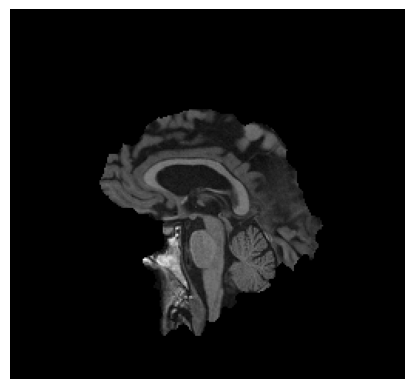

Processing file: MCI_13.nii


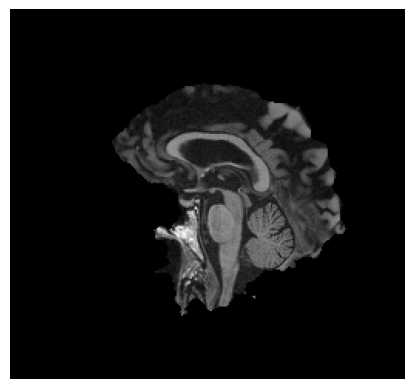

Processing file: MCI_14.nii


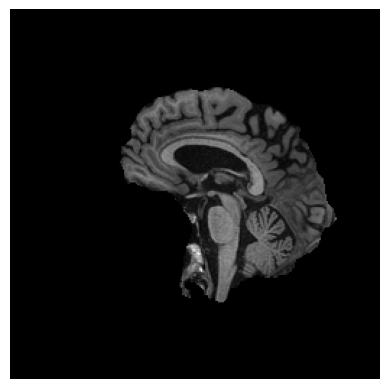

Processing file: MCI_23.nii


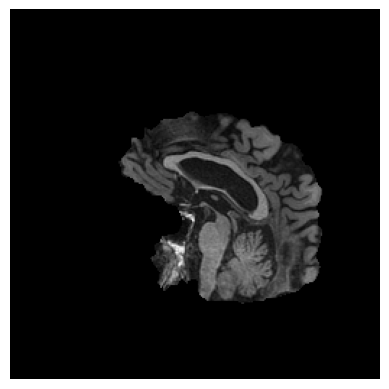

Processing file: MCI_61.nii


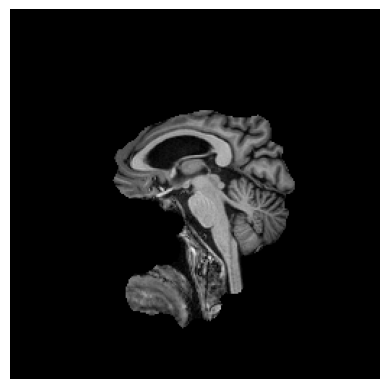

Processing file: MCI_70.nii


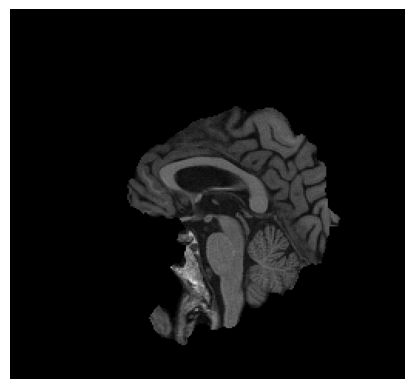

Processing file: MCI_21.nii


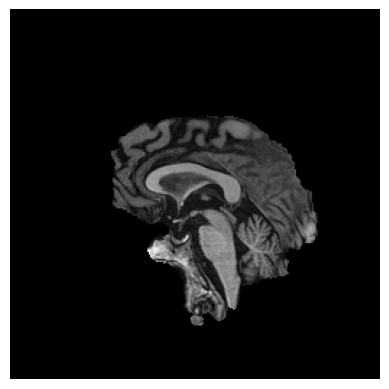

Processing file: MCI_30.nii


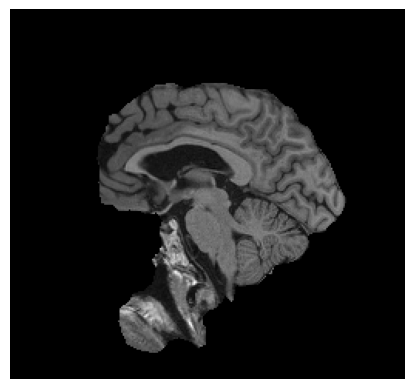

Processing file: MCI_49.nii


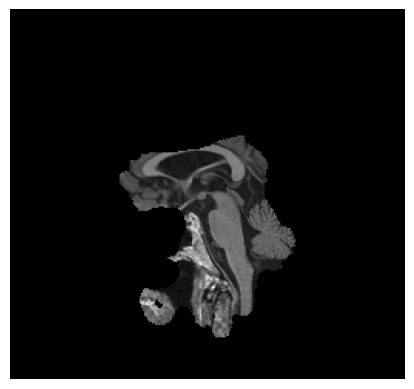

Processing file: MCI_16.nii


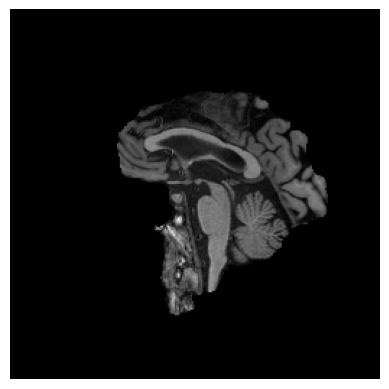

Processing file: MCI_12.nii


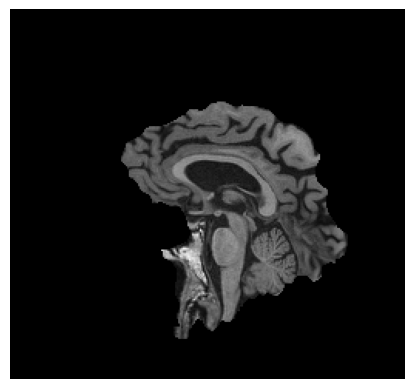

Processing file: MCI_20.nii


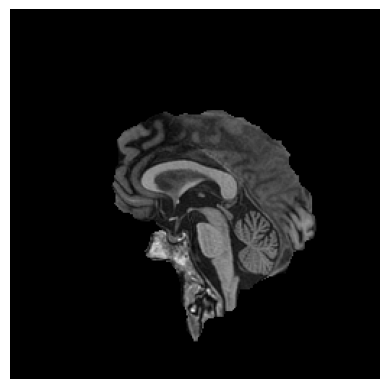

Processing file: MCI_4.nii


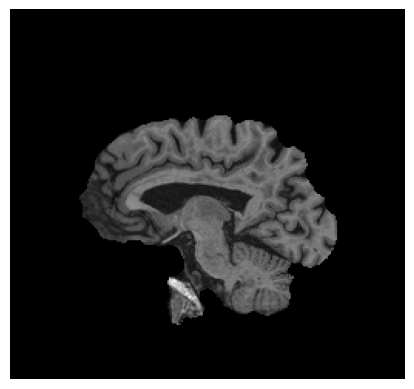

Processing file: MCI_1.nii


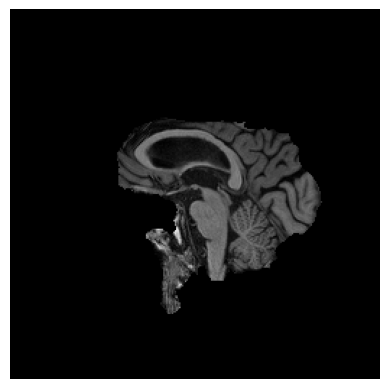

Processing file: MCI_75.nii


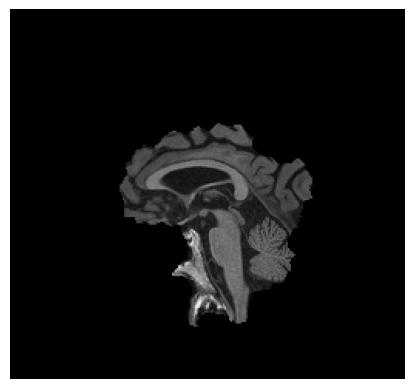

Processing file: MCI_34.nii


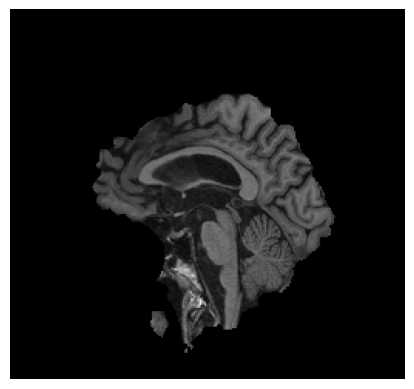

Processing file: MCI_60.nii


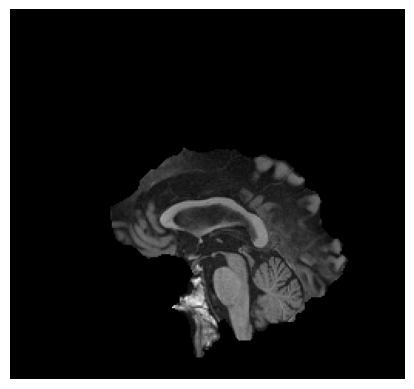

Processing file: MCI_50.nii


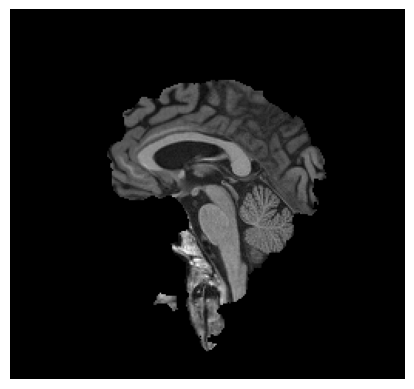

Processing file: MCI_42.nii


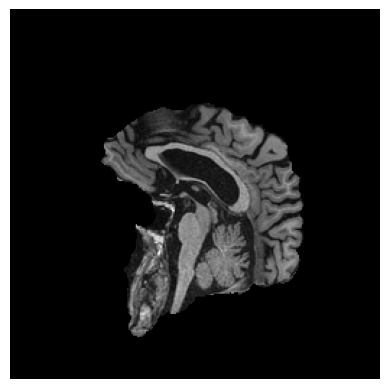

Processing file: CN_4.nii


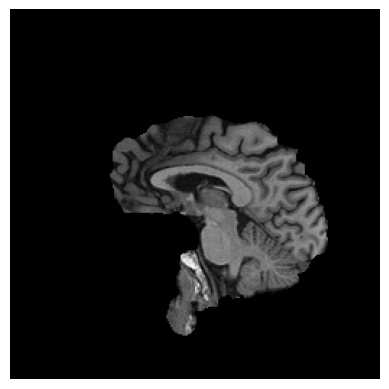

Processing file: CN_42.nii


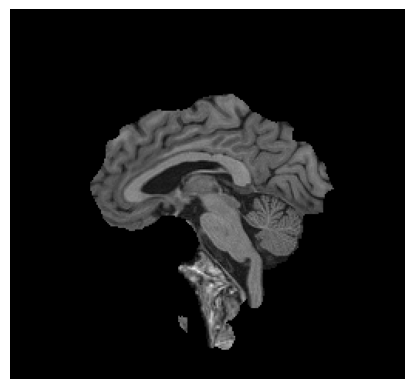

Processing file: CN_70.nii


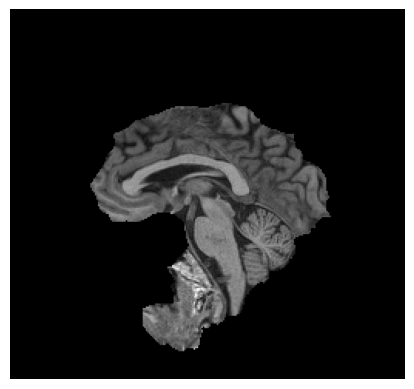

Processing file: CN_65.nii


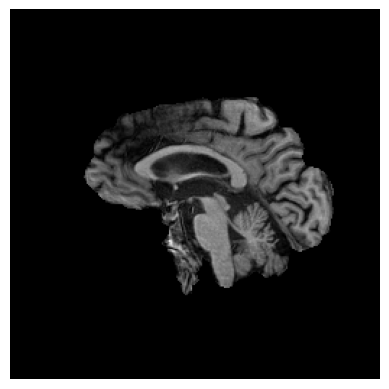

Processing file: CN_48.nii


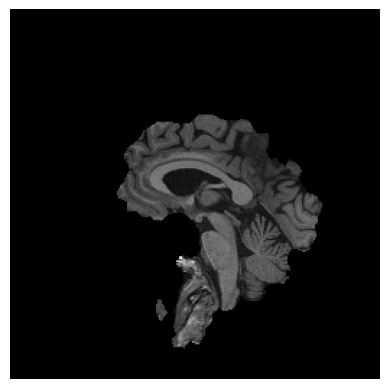

Processing file: CN_50.nii


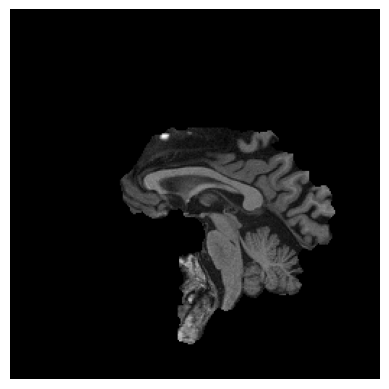

Processing file: CN_38.nii


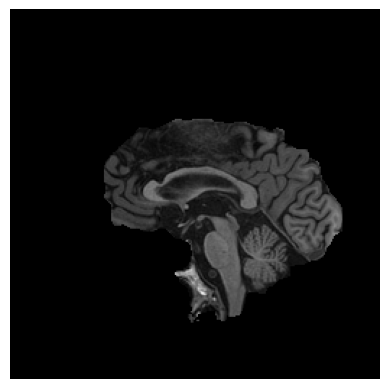

Processing file: CN_57.nii


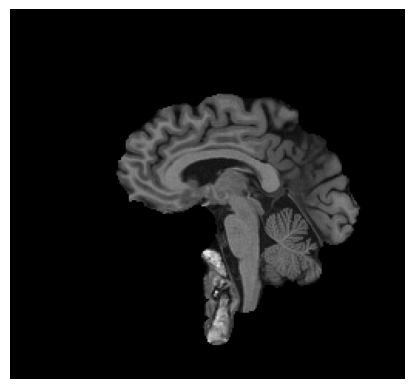

Processing file: CN_52.nii


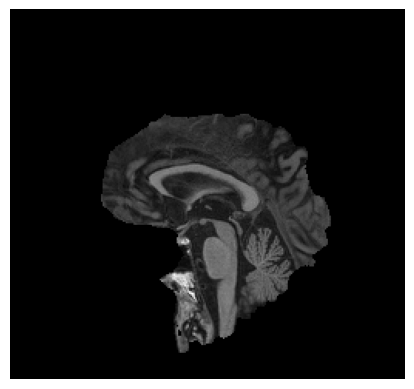

Processing file: CN_61.nii


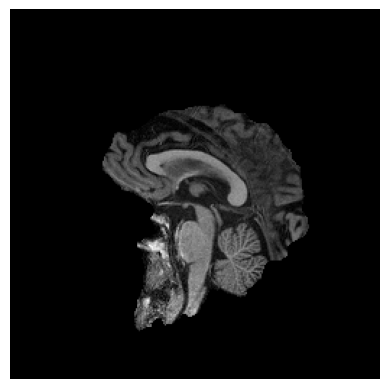

Processing file: CN_53.nii


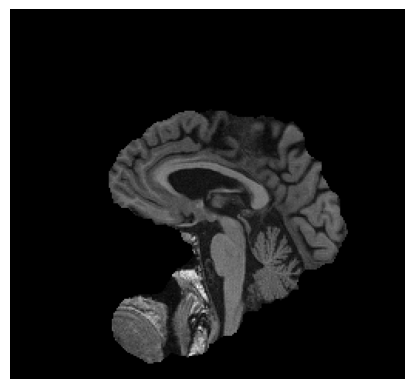

Processing file: CN_64.nii


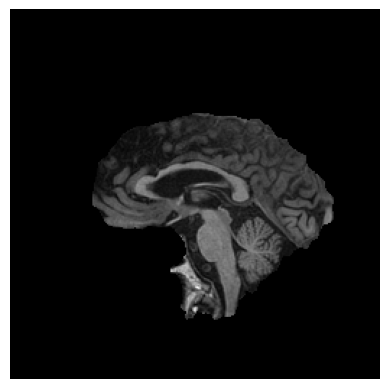

Processing file: CN_68.nii


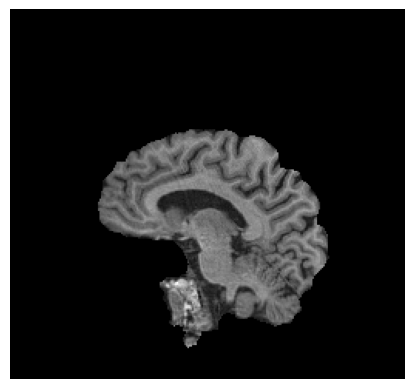

Processing file: CN_62.nii


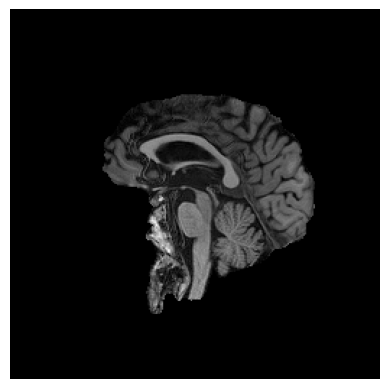

Processing file: CN_39.nii


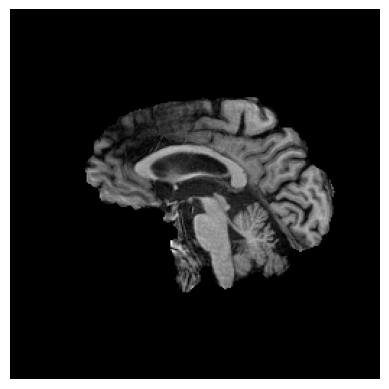

Processing file: CN_18.nii


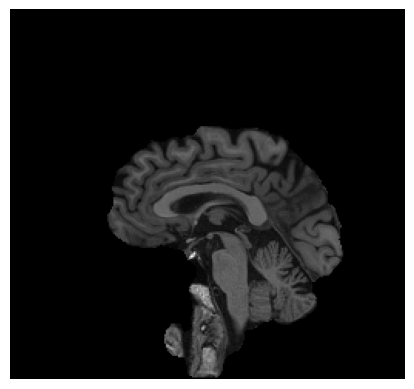

Processing file: CN_69.nii


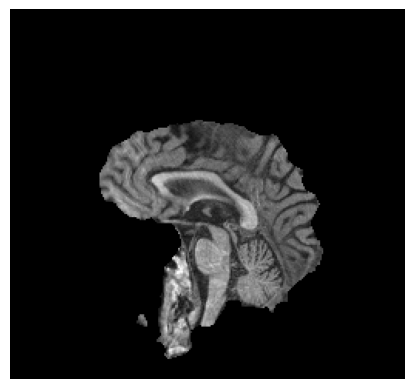

Processing file: CN_72.nii


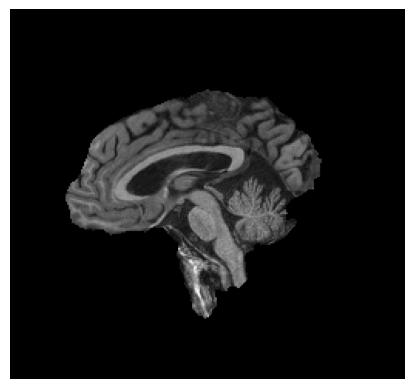

Processing file: CN_16.nii


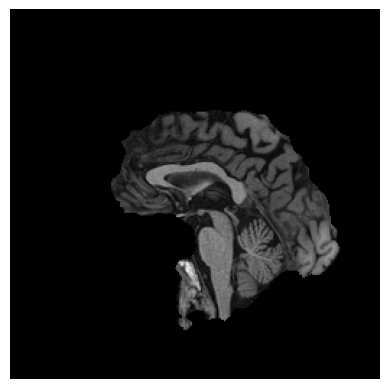

Processing file: CN_55.nii


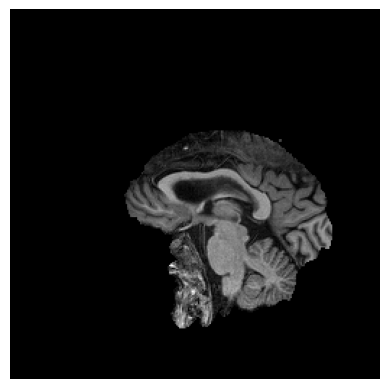

Processing file: CN_15.nii


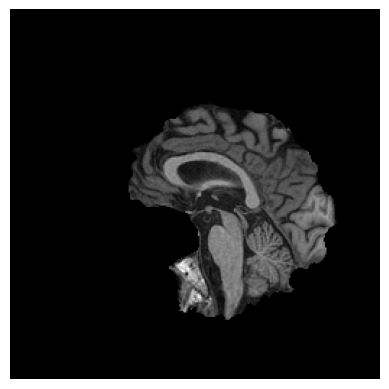

Processing file: CN_11.nii


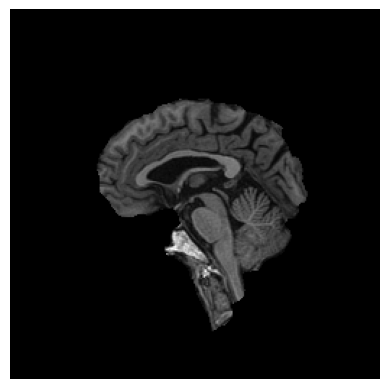

Processing file: CN_76.nii


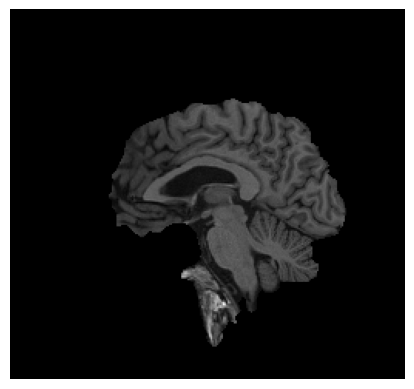

Processing file: CN_74.nii


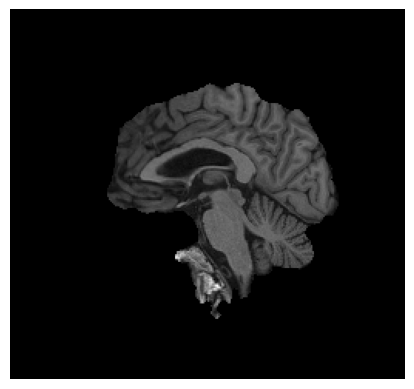

Processing file: CN_59.nii


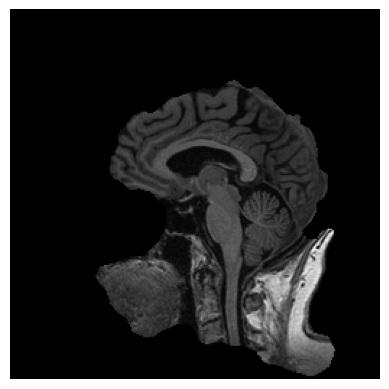

Processing file: CN_13.nii


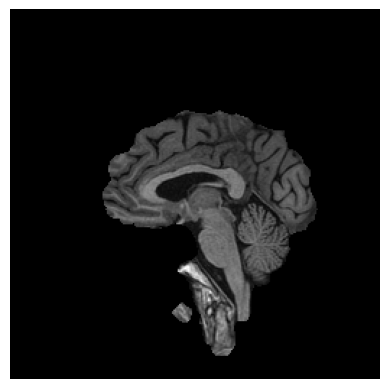

Processing file: CN_75.nii


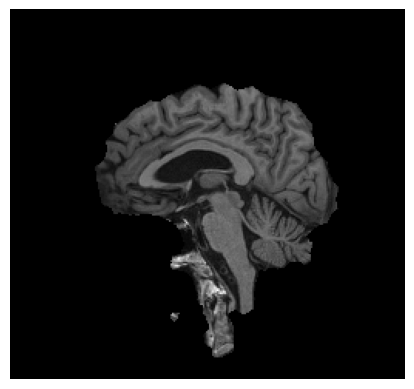

Processing file: CN_12.nii


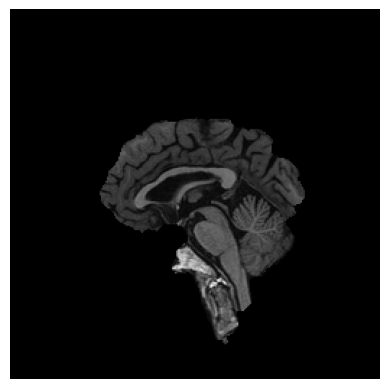

Processing file: CN_77.nii


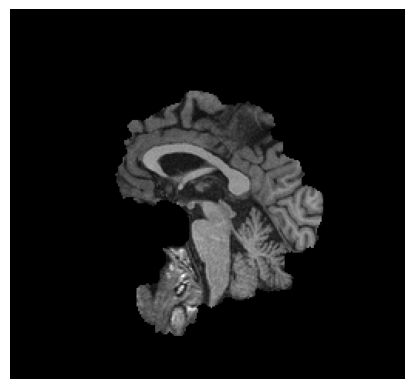

Processing file: CN_3.nii


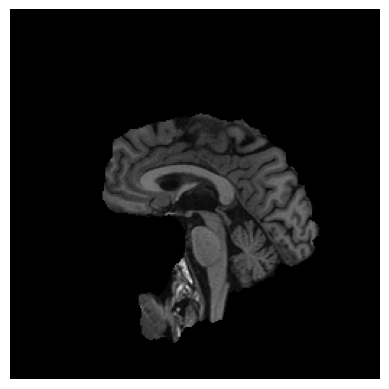

Processing file: CN_43.nii


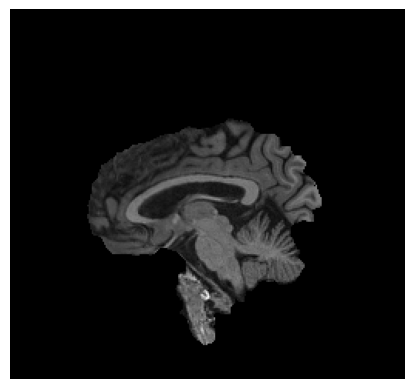

Processing file: CN_58.nii


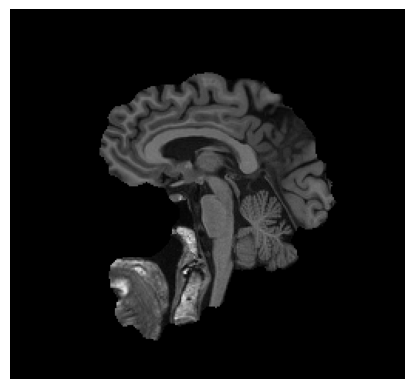

Processing file: CN_1.nii


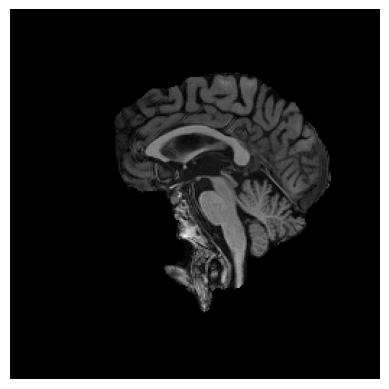

Processing file: CN_17.nii


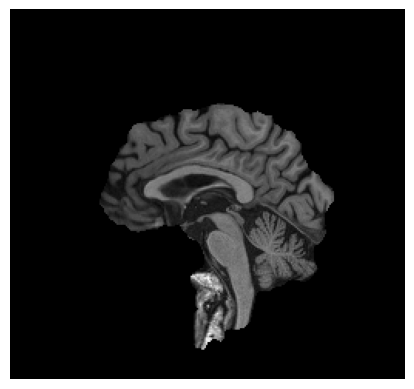

Processing file: CN_23.nii


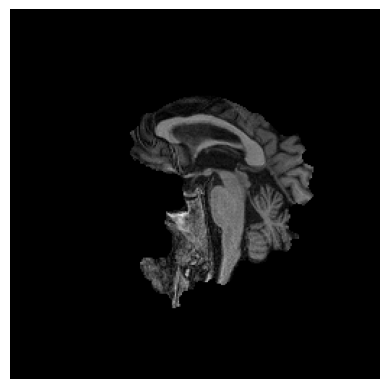

Processing file: CN_67.nii


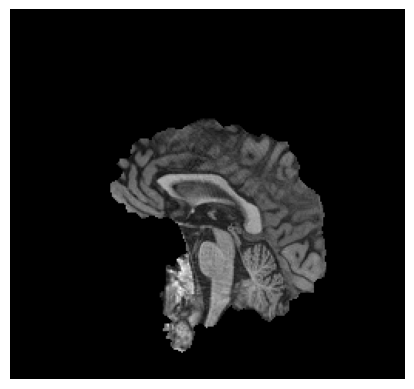

Processing file: CN_71.nii


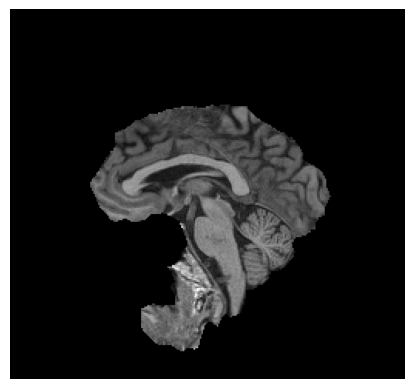

Processing file: CN_47.nii


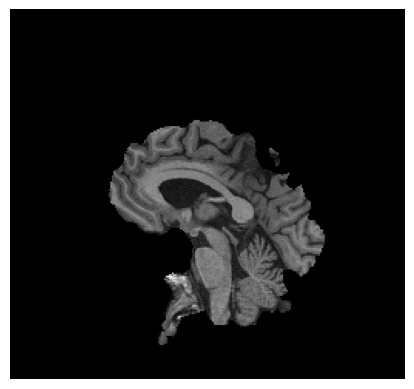

Processing file: CN_25.nii


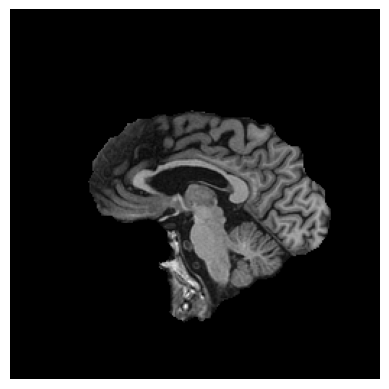

Processing file: CN_8.nii


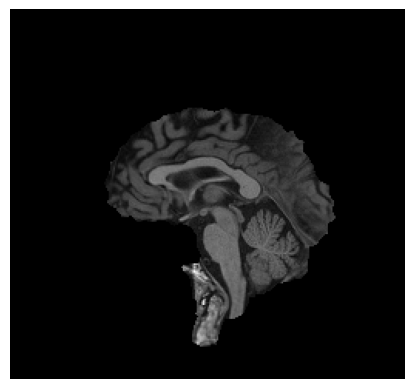

Processing file: CN_24.nii


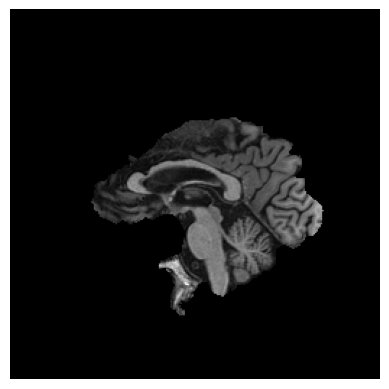

Processing file: CN_60.nii


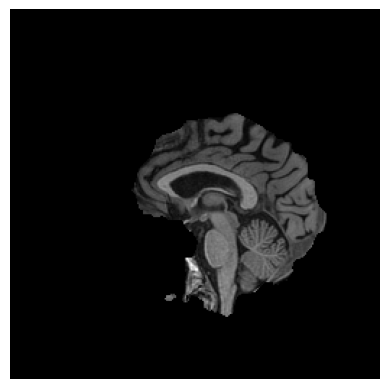

Processing file: CN_40.nii


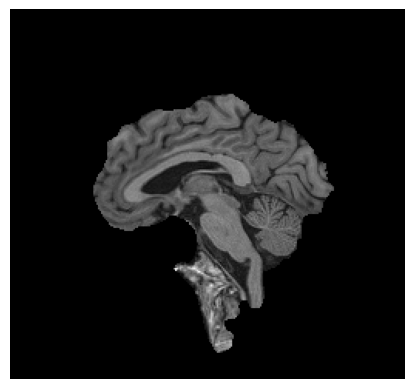

Processing file: CN_32.nii


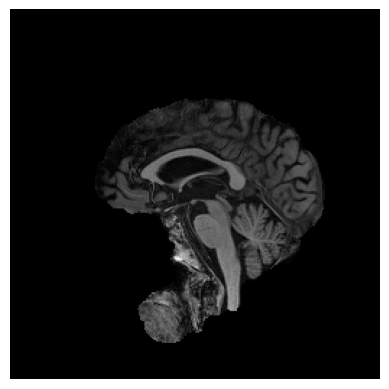

Processing file: CN_26.nii


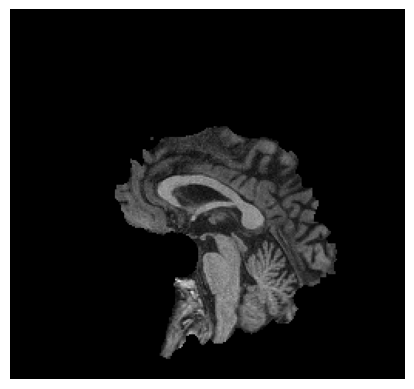

Processing file: CN_49.nii


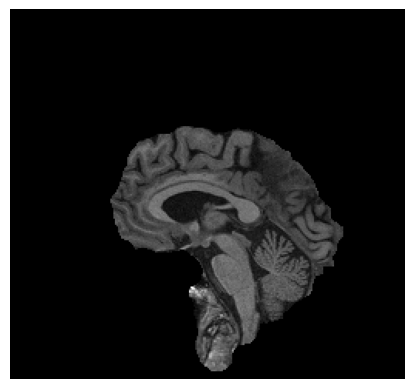

Processing file: CN_33.nii


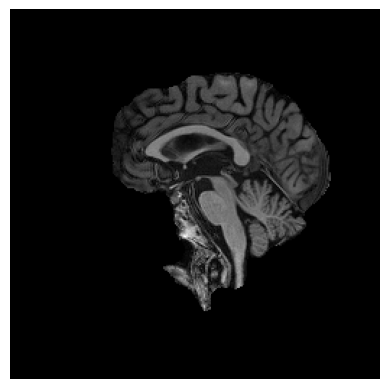

Processing file: CN_27.nii


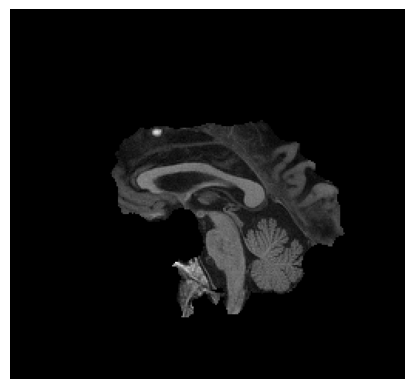

Processing file: CN_78.nii


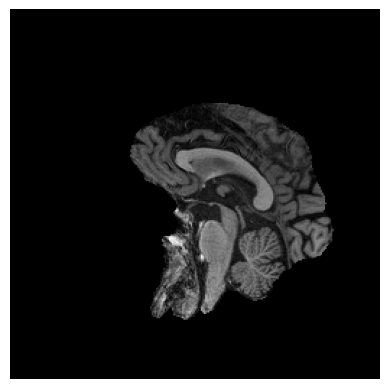

Processing file: CN_44.nii


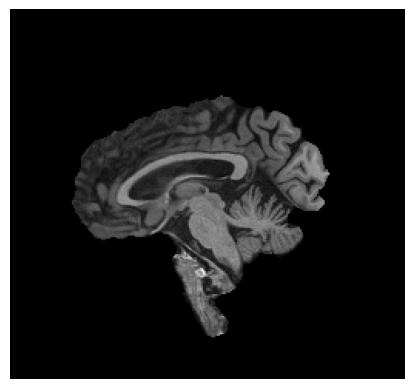

Processing file: CN_35.nii


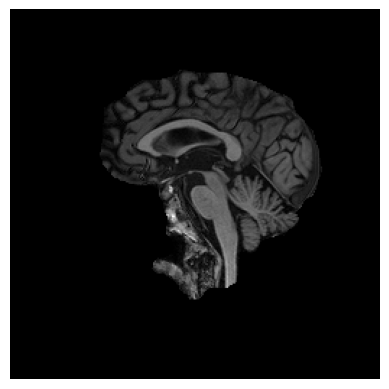

Processing file: CN_66.nii


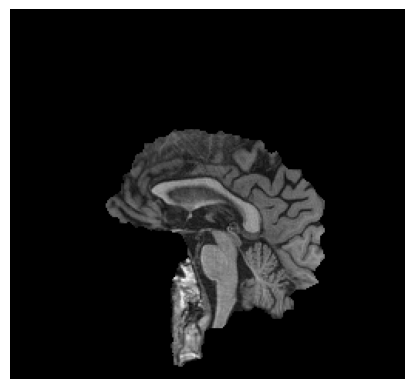

Processing file: CN_54.nii


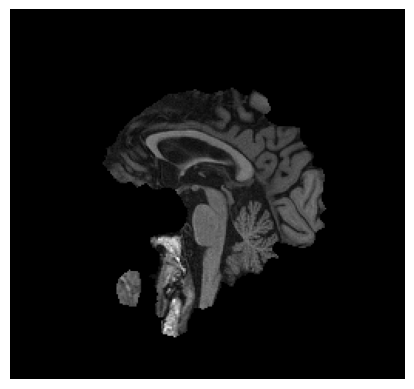

Processing file: CN_19.nii


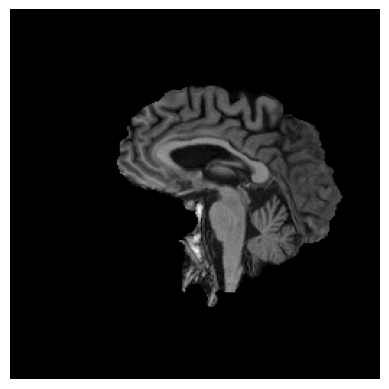

Processing file: CN_30.nii


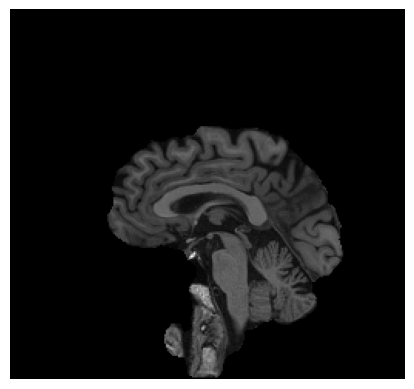

Processing file: CN_10.nii


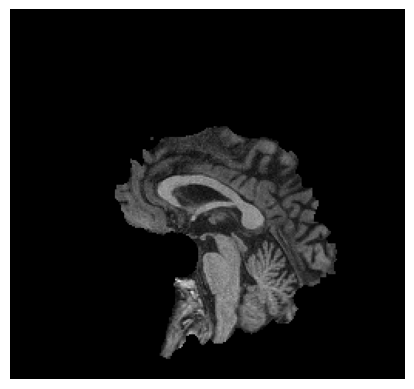

Processing file: CN_79.nii


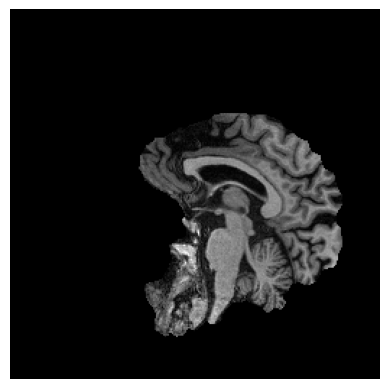

Processing file: CN_28.nii


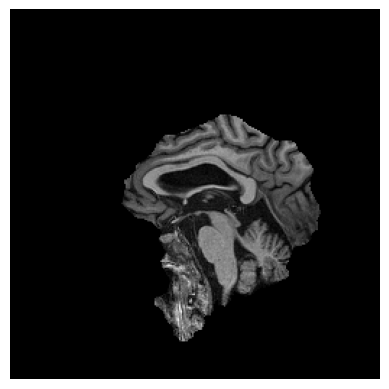

Processing file: CN_14.nii


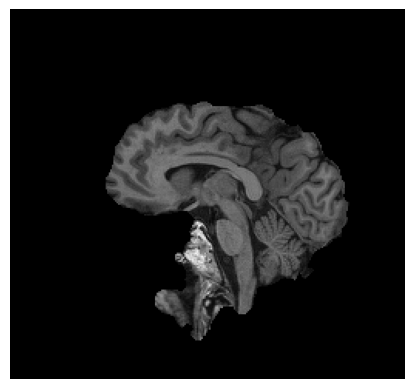

Processing file: CN_51.nii


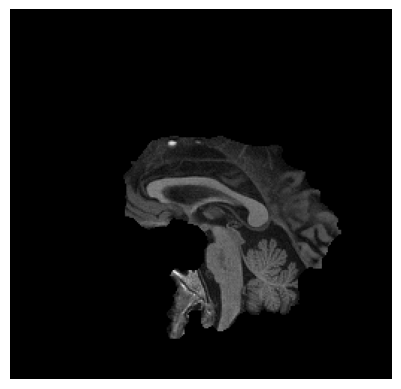

Processing file: CN_31.nii


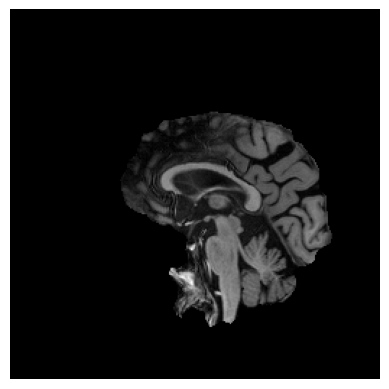

Processing file: CN_36.nii


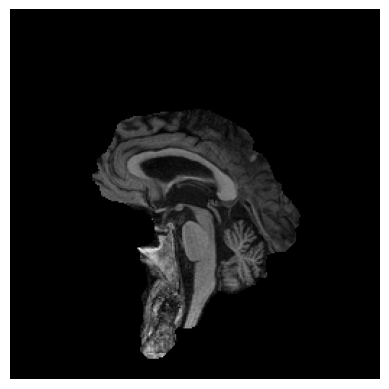

Processing file: CN_34.nii


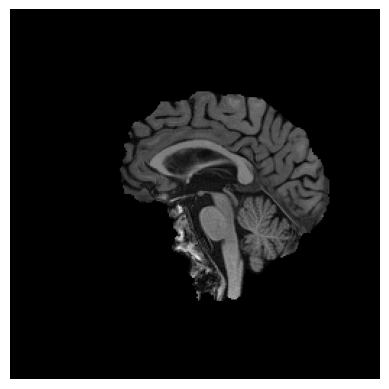

Processing file: CN_29.nii


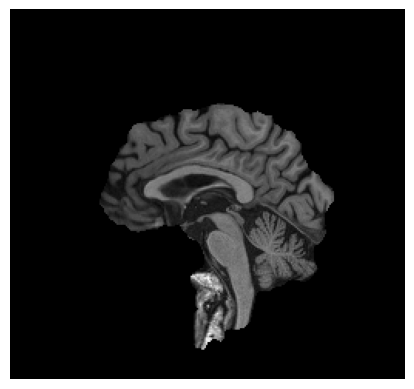

Processing file: CN_63.nii


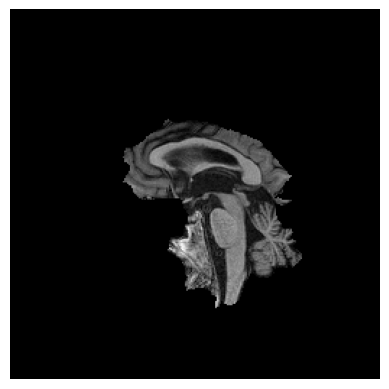

Processing file: CN_46.nii


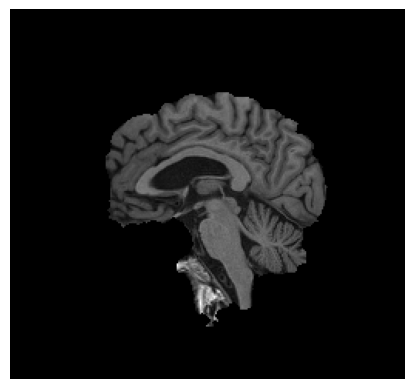

Processing file: CN_9.nii


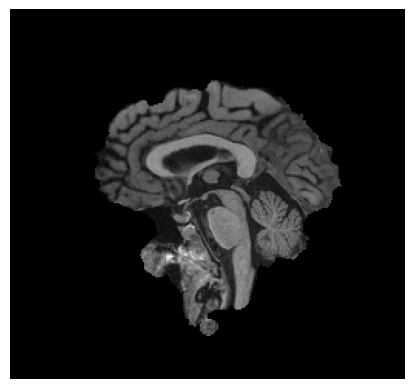

Processing file: CN_2.nii


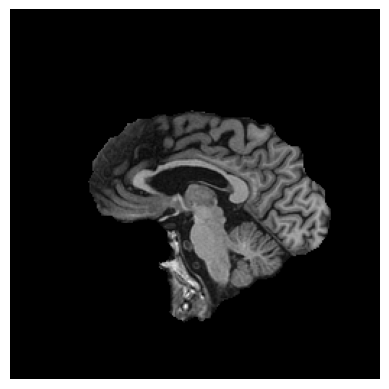

Processing file: CN_5.nii


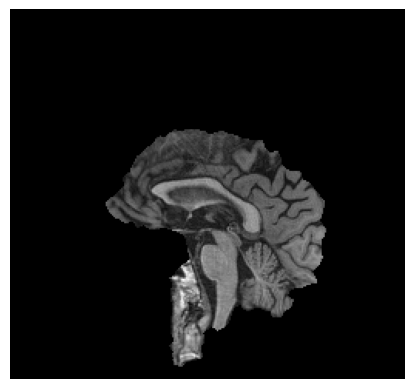

Processing file: CN_45.nii


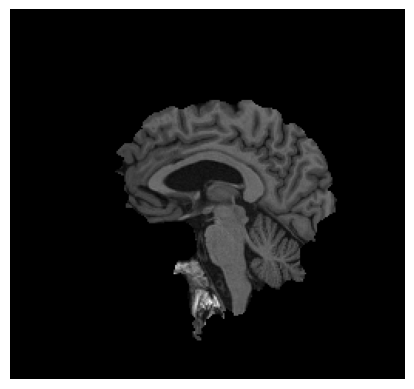

Processing file: CN_41.nii


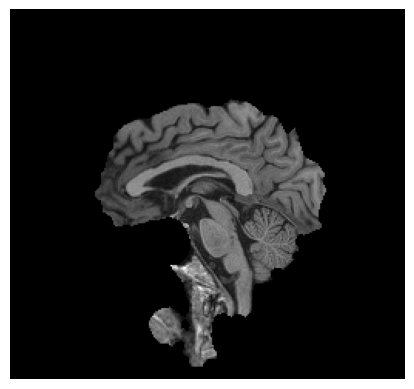

Processing file: CN_56.nii


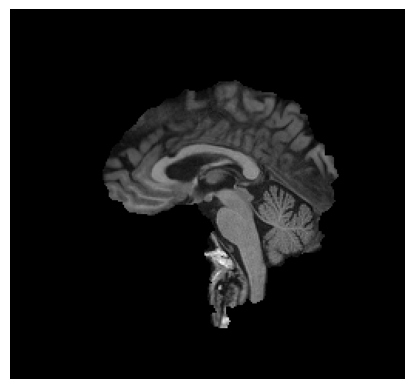

Processing file: CN_73.nii


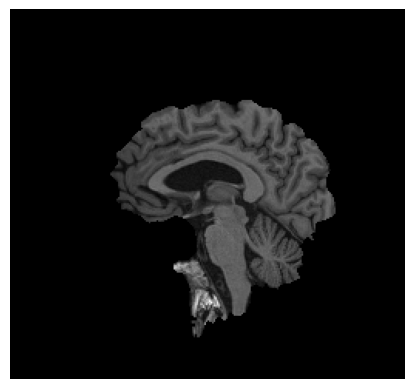

Processing file: CN_6.nii


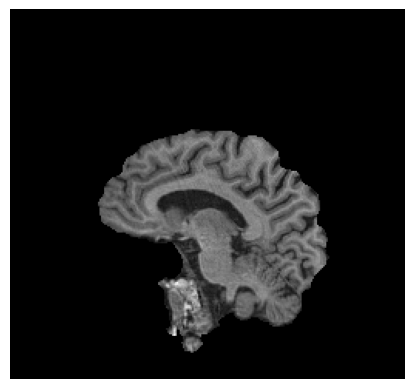

Processing file: CN_7.nii


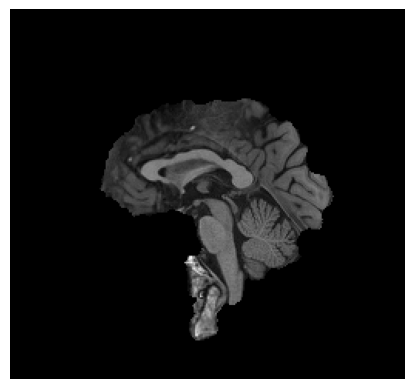

Processing file: CN_80.nii


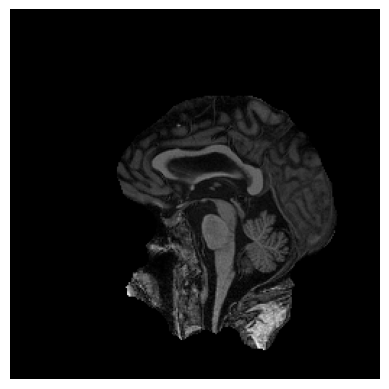

Processing file: CN_21.nii


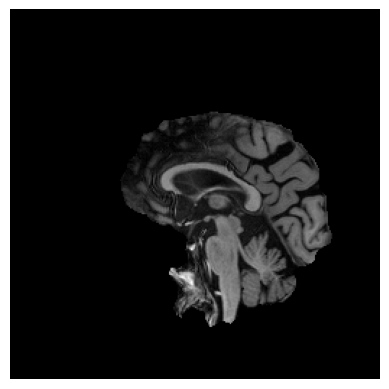

Processing file: CN_20.nii


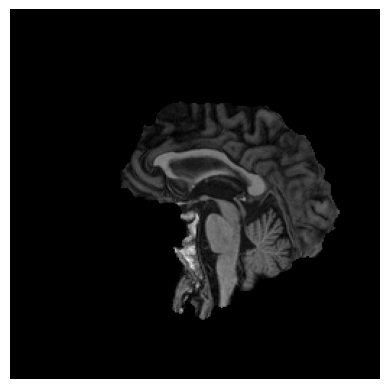

Processing file: CN_37.nii


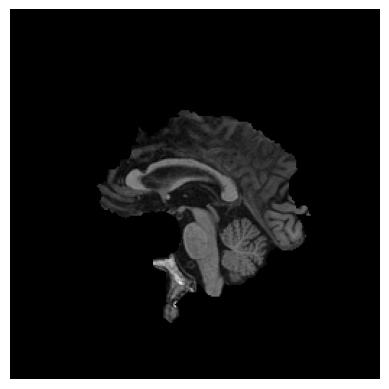

Processing file: CN_22.nii


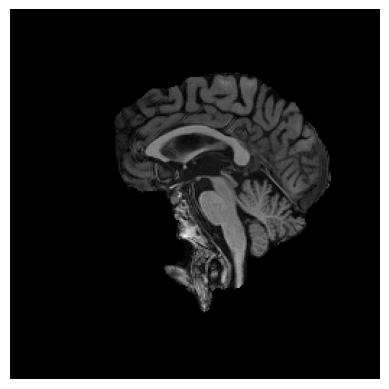

In [5]:
# Load images and filenames
def load_images_and_filenames(paths):
    images = []
    file_names = []
    for path in paths:
        img = nib.load(path)
        images.append(img.get_fdata())
        file_names.append(os.path.basename(path))
    return images, file_names

AD_images, AD_file_names = load_images_and_filenames(AD_paths)
MCI_images, MCI_file_names = load_images_and_filenames(MCI_paths)
CN_images, CN_file_names = load_images_and_filenames(CN_paths)

# Combine all data
images = AD_images + MCI_images + CN_images
file_names = AD_file_names + MCI_file_names + CN_file_names

# Output directory
output_dir = 'saved_mri_images'
os.makedirs(output_dir, exist_ok=True)

# Visualization and saving function
def visualize_and_save_3d_image(image, file_name):
    plt.imshow(image[:, :, image.shape[2] // 2], cmap='gray')
    plt.axis('off')
    save_path = os.path.join(output_dir, f"{file_name}.png")
    plt.savefig(save_path, bbox_inches='tight', pad_inches=0)
    plt.show()
    plt.close()

# Process and display file names
for image, file_name in zip(images, file_names):
    print(f"Processing file: {file_name}")  
    visualize_and_save_3d_image(image, file_name)

## Augmentation

In [6]:
def read_nifti_file(filepath):
    return nib.load(filepath).get_fdata()

def normalize(volume, min_val=-1000, max_val=400):
    volume = volume.clip(min=min_val, max=max_val)
    volume = (volume - min_val) / (max_val - min_val)
    return volume.astype("float32")

def resize_volume(img, desired_depth=64, desired_width=128, desired_height=128):
    scale_factors = (
        desired_width / img.shape[0],
        desired_height / img.shape[1],
        desired_depth / img.shape[2],
    )
    img = ndimage.rotate(img, 90, reshape=False)
    return ndimage.zoom(img, scale_factors, order=1)

def process_scan(path):
    volume = read_nifti_file(path)
    volume = normalize(volume)
    return resize_volume(volume)

In [7]:
# Data process
AD_scans = np.array([process_scan(path) for path in AD_paths])
MCI_scans = np.array([process_scan(path) for path in MCI_paths])
CN_scans = np.array([process_scan(path) for path in CN_paths])

# Labeling
AD_labels = np.array([0 for _ in range(len(AD_scans))])
MCI_labels = np.array([1 for _ in range(len(MCI_scans))])
CN_labels = np.array([2 for _ in range(len(CN_scans))])

# Split data 
split_ratio = 0.90
split_index_AD = int(split_ratio * len(AD_scans))
split_index_MCI = int(split_ratio * len(MCI_scans))
split_index_CN = int(split_ratio * len(CN_scans))

# Training data
x_train = np.concatenate((AD_scans[:split_index_AD], MCI_scans[:split_index_MCI], CN_scans[:split_index_CN]), axis=0)
y_train = np.concatenate((AD_labels[:split_index_AD], MCI_labels[:split_index_MCI], CN_labels[:split_index_CN]), axis=0)

# Validation data
x_val = np.concatenate((AD_scans[split_index_AD:], MCI_scans[split_index_MCI:], CN_scans[split_index_CN:]), axis=0)
y_val = np.concatenate((AD_labels[split_index_AD:], MCI_labels[split_index_MCI:], CN_labels[split_index_CN:]), axis=0)

# Process test data
AD_test_scans = np.array([process_scan(path) for path in AD_raw_paths])
MCI_test_scans = np.array([process_scan(path) for path in MCI_raw_paths])
CN_test_scans = np.array([process_scan(path) for path in CN_raw_paths])

# Labeling for test data
AD_test_labels = np.array([0 for _ in range(len(AD_test_scans))])
MCI_test_labels = np.array([1 for _ in range(len(MCI_test_scans))])
CN_test_labels = np.array([2 for _ in range(len(CN_test_scans))])

# Combine test data and labels
x_test = np.concatenate((AD_test_scans, MCI_test_scans, CN_test_scans), axis=0)
y_test = np.concatenate((AD_test_labels, MCI_test_labels, CN_test_labels), axis=0)

print("Number of test samples:", 
      x_test.shape[0])

print(
    "Number of samples in train and validation are %d and %d."
    % (x_train.shape[0], x_val.shape[0])
)

Number of test samples: 150
Number of samples in train and validation are 216 and 24.


## Data augmentation

In [8]:
def rotate(volume):
    def scipy_rotate(volume):
        angles = [-20, -10, -5, 5, 10, 20]
        angle = random.choice(angles)
        volume = ndimage.rotate(volume, angle, reshape=False)
        volume[volume < 0] = 0
        volume[volume > 1] = 1
        return volume
    augmented_volume = tf.numpy_function(scipy_rotate, [volume], tf.float32)
    return augmented_volume

def train_preprocessing(volume, label):
    volume = rotate(volume)
    volume = tf.expand_dims(volume, axis=3)
    return volume, label

def validation_preprocessing(volume, label):
    volume = tf.expand_dims(volume, axis=3)
    return volume, label

In [9]:
# Define data loaders.
train_loader = tf.data.Dataset.from_tensor_slices((x_train, y_train))
validation_loader = tf.data.Dataset.from_tensor_slices((x_val, y_val))
batch_size = 2

# Augment the on the fly during training.
train_dataset = (
    train_loader.shuffle(len(x_train))
    .map(train_preprocessing)
    .batch(batch_size)
    .prefetch(2)
    )

# Rescale.
validation_dataset = (
    validation_loader.shuffle(len(x_val))
    .map(validation_preprocessing)
    .batch(batch_size)
    .prefetch(2)
    )

Dimension of MRI is: (128, 128, 64, 1)


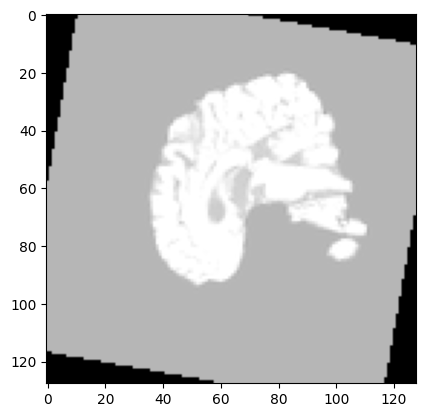

In [10]:
data = train_dataset.take(1)
images, labels = list(data)[0]
images = images.numpy()
image = images[0]
print("Dimension of MRI is:", image.shape)
plt.imshow(np.squeeze(image[:, :, 30]), cmap="gray")

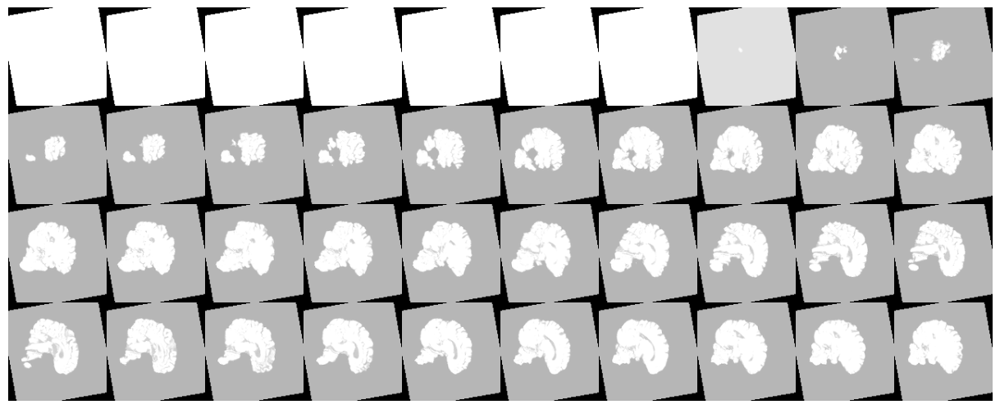

In [11]:
def plot_slices(num_rows, num_columns, width, height, data):
    data = np.rot90(np.array(data))
    data = np.transpose(data)
    data = np.reshape(data, (num_rows, num_columns, width, height))
    rows_data, columns_data = data.shape[0], data.shape[1]
    heights = [slc[0].shape[0] for slc in data]
    widths = [slc.shape[1] for slc in data[0]]
    fig_width = 12.0
    fig_height = fig_width * sum(heights) / sum(widths)
    f, axarr = plt.subplots(
        rows_data,
        columns_data,
        figsize=(fig_width, fig_height),
        gridspec_kw={"height_ratios": heights},
    )
    for i in range(rows_data):
        for j in range(columns_data):
            axarr[i, j].imshow(data[i][j], cmap="gray")
            axarr[i, j].axis("off")
    plt.subplots_adjust(wspace=0, hspace=0, left=0, right=1, bottom=0, top=1)
    plt.show()
    
plot_slices(4, 10, 128, 128, image[:, :, :40])

## Build Model

In [12]:
from tensorflow.keras import layers, models

def residual_block(input_tensor, filters, kernel_size=3, strides=1):
    """
    Residual block for 3D ResNet.
    """
    # First convolution
    x = layers.Conv3D(filters, kernel_size=kernel_size, strides=strides, padding="same", activation="relu")(input_tensor)
    x = layers.BatchNormalization()(x)

    # Second convolution
    x = layers.Conv3D(filters, kernel_size=kernel_size, strides=1, padding="same", activation=None)(x)
    x = layers.BatchNormalization()(x)

    # Shortcut connection
    if strides > 1 or input_tensor.shape[-1] != filters:
        shortcut = layers.Conv3D(filters, kernel_size=1, strides=strides, padding="same")(input_tensor)
        shortcut = layers.BatchNormalization()(shortcut)
    else:
        shortcut = input_tensor

    # Add shortcut and activate
    x = layers.add([x, shortcut])
    x = layers.ReLU()(x)
    return x

def build_3d_resnet(input_shape=(128, 128, 64, 1), num_classes=3):
    inputs = layers.Input(input_shape)

    # Initial convolutional layer
    x = layers.Conv3D(64, kernel_size=(7, 7, 7), strides=2, padding="same", activation="relu")(inputs)
    x = layers.BatchNormalization()(x)
    x = layers.MaxPool3D(pool_size=(3, 3, 3), strides=2, padding="same")(x)

    # Residual blocks
    x = residual_block(x, filters=64)
    x = residual_block(x, filters=64)
    x = residual_block(x, filters=128, strides=2)
    x = residual_block(x, filters=128)
    x = residual_block(x, filters=256, strides=2)
    x = residual_block(x, filters=256)
    x = residual_block(x, filters=512, strides=2)
    x = residual_block(x, filters=512)

    # Global Average Pooling
    x = layers.GlobalAveragePooling3D()(x)

    # Fully connected layers
    x = layers.Dense(256, activation="relu")(x)
    x = layers.Dropout(0.5)(x)
    outputs = layers.Dense(num_classes, activation="softmax")(x)

    # Define the model
    model = models.Model(inputs, outputs, name="3d_resnet")
    return model

# Build and summarize the model
model = build_3d_resnet(input_shape=(128, 128, 64, 1), num_classes=3)
model.summary()


Model: "3d_resnet"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer         │ (None, 128, 128,  │          0 │ -                 │
│ (InputLayer)        │ 64, 1)            │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv3d (Conv3D)     │ (None, 64, 64,    │     22,016 │ input_layer[0][0] │
│                     │ 32, 64)           │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalization │ (None, 64, 64,    │        256 │ conv3d[0][0]      │
│ (BatchNormalizatio… │ 32, 64)           │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling3d       │ (None, 32, 32,    │          0 │ batch_normalizat… │
│ (MaxPooling3D)      │ 16, 64)           │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv3d_1 (Conv3D)   │ (None, 32, 32,    │    110,656 │ max_pooling3d[0]… │
│                     │ 16, 64)           │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 32, 32,    │        256 │ conv3d_1[0][0]    │
│ (BatchNormalizatio… │ 16, 64)           │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv3d_2 (Conv3D)   │ (None, 32, 32,    │    110,656 │ batch_normalizat… │
│                     │ 16, 64)           │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 32, 32,    │        256 │ conv3d_2[0][0]    │
│ (BatchNormalizatio… │ 16, 64)           │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ add (Add)           │ (None, 32, 32,    │          0 │ batch_normalizat… │
│                     │ 16, 64)           │            │ max_pooling3d[0]… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ re_lu (ReLU)        │ (None, 32, 32,    │          0 │ add[0][0]         │
│                     │ 16, 64)           │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv3d_3 (Conv3D)   │ (None, 32, 32,    │    110,656 │ re_lu[0][0]       │
│                     │ 16, 64)           │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 32, 32,    │        256 │ conv3d_3[0][0]    │
│ (BatchNormalizatio… │ 16, 64)           │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv3d_4 (Conv3D)   │ (None, 32, 32,    │    110,656 │ batch_normalizat… │
│                     │ 16, 64)           │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 32, 32,    │        256 │ conv3d_4[0][0]    │
│ (BatchNormalizatio… │ 16, 64)           │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ add_1 (Add)         │ (None, 32, 32,    │          0 │ batch_normalizat… │
│                     │ 16, 64)           │            │ re_lu[0][0]       │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ re_lu_1 (ReLU)      │ (None, 32, 32,    │          0 │ add_1[0][0]       │
│                     │ 16, 64)           │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv3d_5 (Conv3D)   │ (None, 16, 16, 8, │    221,312 │ re_lu_1[0][0]   

 Total params: 33,306,499 (127.05 MB)

 Trainable params: 33,296,899 (127.02 MB)

 Non-trainable params: 9,600 (37.50 KB)

In [13]:
!apt-get install -y graphviz
!pip install pydot graphviz
from tensorflow.keras.utils import plot_model

# Save the model architecture to a file (in PNG format)
plot_model(model, to_file='3d_resnet.png', show_shapes=True, show_layer_names=True)

/opt/conda/lib/python3.10/pty.py:89: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  pid, fd = os.forkpty()





graphviz is already the newest version (2.42.2-6ubuntu0.1).
0 upgraded, 0 newly installed, 0 to remove and 82 not upgraded.


## Train model

In [14]:
import time
from tensorflow.keras.callbacks import Callback, EarlyStopping, ModelCheckpoint
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.optimizers.schedules import ExponentialDecay

# Callbacks
class StopOnPerfectAccuracy(Callback):
    def on_epoch_end(self, epoch, logs=None):
        if logs.get('val_accuracy') == 1.0:
            print("\nValidation accuracy reached 100%. Stopping training!")
            self.model.stop_training = True

callbacks = [
    EarlyStopping(monitor='val_accuracy', 
                  mode='max', 
                  patience=50, 
                  verbose=1),
    ModelCheckpoint(filepath='./best_weights.keras', 
                    monitor='val_accuracy', 
                    mode='max', 
                    save_best_only=True, 
                    verbose=1),
    StopOnPerfectAccuracy()
]

# Compile the model
model.compile(
    loss="sparse_categorical_crossentropy",
    optimizer=Adam(learning_rate=ExponentialDecay(
                    initial_learning_rate=0.0001, 
                    decay_steps=100000, 
                    decay_rate=0.96, 
                    staircase=True)
                  ),
    metrics=["accuracy"],
    run_eagerly=True
)

# Start training time
start_time = time.time()

# Train the model
model_history = model.fit(
    train_dataset,
    validation_data=validation_dataset,
    epochs=150,
    shuffle=True,
    verbose=2,
    callbacks=callbacks
)

# Calculate the total training time
end_time = time.time()
total_training_time = end_time - start_time
print(f"\nTotal training time: {total_training_time:.2f} seconds")

Epoch 1/150

Epoch 1: val_accuracy improved from -inf to 0.33333, saving model to ./best_weights.keras
108/108 - 65s - 598ms/step - accuracy: 0.4074 - loss: 1.4236 - val_accuracy: 0.3333 - val_loss: 1.1403
Epoch 2/150

Epoch 2: val_accuracy did not improve from 0.33333
108/108 - 58s - 538ms/step - accuracy: 0.3657 - loss: 1.2765 - val_accuracy: 0.3333 - val_loss: 1.5434
Epoch 3/150

Epoch 3: val_accuracy did not improve from 0.33333
108/108 - 58s - 537ms/step - accuracy: 0.3750 - loss: 1.1664 - val_accuracy: 0.3333 - val_loss: 1.5210
Epoch 4/150

Epoch 4: val_accuracy did not improve from 0.33333
108/108 - 58s - 538ms/step - accuracy: 0.4352 - loss: 1.1206 - val_accuracy: 0.3333 - val_loss: 1.8395
Epoch 5/150

Epoch 5: val_accuracy improved from 0.33333 to 0.50000, saving model to ./best_weights.keras
108/108 - 60s - 558ms/step - accuracy: 0.3981 - loss: 1.1615 - val_accuracy: 0.5000 - val_loss: 0.9949
Epoch 6/150

Epoch 6: val_accuracy did not improve from 0.50000
108/108 - 58s - 536m

## Model Evaluation

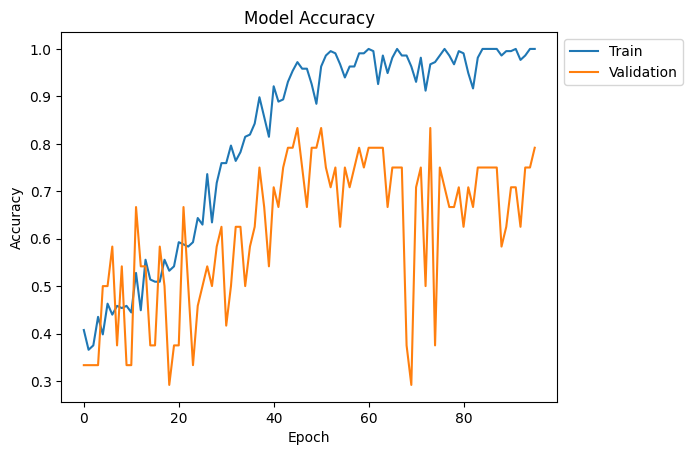

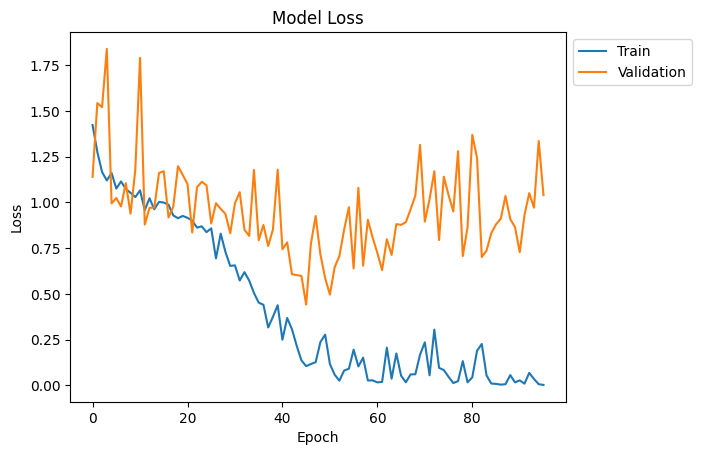

In [15]:
# Plot Accuracy
plt.plot(model_history.history['accuracy'])
plt.plot(model_history.history['val_accuracy'])
plt.title('Model Accuracy')
plt.ylabel('Accuracy')
plt.xlabel('Epoch')
plt.legend(['Train', 'Validation'], loc='upper left', bbox_to_anchor=(1,1))
plt.savefig('model_accuracy.png', bbox_inches='tight')  # Save the plot
plt.show()

# Plot Loss
plt.plot(model_history.history['loss'])
plt.plot(model_history.history['val_loss'])
plt.title('Model Loss')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.legend(['Train', 'Validation'], loc='upper left', bbox_to_anchor=(1,1))
plt.savefig('model_loss.png', bbox_inches='tight')  # Save the plot
plt.show()

12/12 ━━━━━━━━━━━━━━━━━━━━ 1s 61ms/step
Accuracy: 25.00%

Classification Report:
              precision    recall  f1-score   support

          AD       0.20      0.25      0.22         8
         MCI       0.40      0.25      0.31         8
          CN       0.22      0.25      0.24         8

    accuracy                           0.25        24
   macro avg       0.27      0.25      0.26        24
weighted avg       0.27      0.25      0.26        24


Per-Class Accuracy and Metrics:
AD: Accuracy = 25.00%
  TP: 2
  FP: 8
  FN: 6
  TN: 8
MCI: Accuracy = 25.00%
  TP: 2
  FP: 3
  FN: 6
  TN: 13
CN: Accuracy = 25.00%
  TP: 2
  FP: 7
  FN: 6
  TN: 9


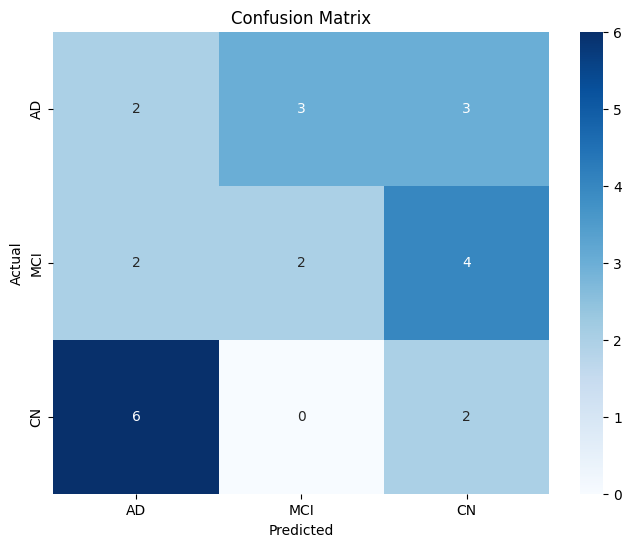

In [16]:
from sklearn.metrics import confusion_matrix, classification_report, accuracy_score
import seaborn as sns
import numpy as np
import matplotlib.pyplot as plt

# Make predictions on the validation dataset
predictions = model.predict(validation_dataset)
predicted_classes = np.argmax(predictions, axis=1)

# Compute the confusion matrix and other metrics
conf_matrix = confusion_matrix(y_val, predicted_classes)
accuracy = accuracy_score(y_val, predicted_classes)
class_report = classification_report(y_val, predicted_classes, target_names=['AD', 'MCI', 'CN'], output_dict=True)

# Calculate per-class accuracy and confusion matrix components (TP, TN, FP, FN)
per_class_accuracy = {}
per_class_metrics = {}

for i, class_name in enumerate(['AD', 'MCI', 'CN']):
    tp = conf_matrix[i, i]  # True Positives
    fp = np.sum(conf_matrix[:, i]) - tp  # False Positives
    fn = np.sum(conf_matrix[i, :]) - tp  # False Negatives
    tn = np.sum(conf_matrix) - (tp + fp + fn)  # True Negatives
    
    per_class_accuracy[class_name] = tp / np.sum(conf_matrix[i, :]) if np.sum(conf_matrix[i, :]) > 0 else 0.0
    per_class_metrics[class_name] = {'TP': tp, 'FP': fp, 'FN': fn, 'TN': tn}

# Display results
print(f"Accuracy: {accuracy * 100:.2f}%\n")
print("Classification Report:")
print(classification_report(y_val, predicted_classes, target_names=['AD', 'MCI', 'CN']))
print("\nPer-Class Accuracy and Metrics:")
for class_name, acc in per_class_accuracy.items():
    print(f"{class_name}: Accuracy = {acc * 100:.2f}%")
    print(f"  TP: {per_class_metrics[class_name]['TP']}")
    print(f"  FP: {per_class_metrics[class_name]['FP']}")
    print(f"  FN: {per_class_metrics[class_name]['FN']}")
    print(f"  TN: {per_class_metrics[class_name]['TN']}")

# Plot confusion matrix
plt.figure(figsize=(8, 6))
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues', 
            xticklabels=['AD', 'MCI', 'CN'], 
            yticklabels=['AD', 'MCI', 'CN'])
plt.ylabel('Actual')
plt.xlabel('Predicted')
plt.title('Confusion Matrix')
plt.show()

In [17]:
# Save the model in the native Keras format
model.save('alzheimer_classification_model.keras')

## Test with Raw Data

5/5 ━━━━━━━━━━━━━━━━━━━━ 4s 459ms/step
Accuracy: 98.67%

Classification Report:
              precision    recall  f1-score   support

          AD       0.98      1.00      0.99        50
         MCI       1.00      0.96      0.98        50
          CN       0.98      1.00      0.99        50

    accuracy                           0.99       150
   macro avg       0.99      0.99      0.99       150
weighted avg       0.99      0.99      0.99       150


Per-Class Accuracy and Metrics:
AD: Accuracy = 100.00%
  TP: 50
  FP: 1
  FN: 0
  TN: 99
MCI: Accuracy = 96.00%
  TP: 48
  FP: 0
  FN: 2
  TN: 100
CN: Accuracy = 100.00%
  TP: 50
  FP: 1
  FN: 0
  TN: 99


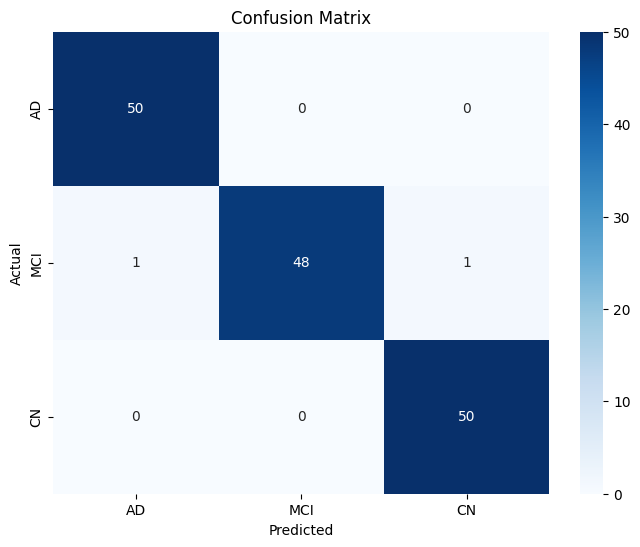

In [18]:
### from sklearn.metrics import confusion_matrix, classification_report, accuracy_score
import seaborn as sns
import numpy as np
import matplotlib.pyplot as plt

# Predict and evaluate
predictions = model.predict(x_test)
predicted_classes = np.argmax(predictions, axis=1)
conf_matrix = confusion_matrix(y_test, predicted_classes)
accuracy = accuracy_score(y_test, predicted_classes)
class_report = classification_report(y_test, predicted_classes, target_names=['AD', 'MCI', 'CN'], output_dict=True)

# Calculate per-class accuracy and confusion matrix components (TP, TN, FP, FN)
per_class_accuracy = {}
per_class_metrics = {}

for i, class_name in enumerate(['AD', 'MCI', 'CN']):
    tp = conf_matrix[i, i]  
    fp = np.sum(conf_matrix[:, i]) - tp  
    fn = np.sum(conf_matrix[i, :]) - tp  
    tn = np.sum(conf_matrix) - (tp + fp + fn)  
    
    per_class_accuracy[class_name] = tp / np.sum(conf_matrix[i, :]) if np.sum(conf_matrix[i, :]) > 0 else 0.0
    per_class_metrics[class_name] = {'TP': tp, 'FP': fp, 'FN': fn, 'TN': tn}

# Display results
print(f"Accuracy: {accuracy * 100:.2f}%\n")
print("Classification Report:")
print(classification_report(y_test, predicted_classes, target_names=['AD', 'MCI', 'CN']))
print("\nPer-Class Accuracy and Metrics:")
for class_name, acc in per_class_accuracy.items():
    print(f"{class_name}: Accuracy = {acc * 100:.2f}%")
    print(f"  TP: {per_class_metrics[class_name]['TP']}")
    print(f"  FP: {per_class_metrics[class_name]['FP']}")
    print(f"  FN: {per_class_metrics[class_name]['FN']}")
    print(f"  TN: {per_class_metrics[class_name]['TN']}")
    
# Plot confusion matrix
plt.figure(figsize=(8, 6))
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues', 
            xticklabels=['AD', 'MCI', 'CN'], 
            yticklabels=['AD', 'MCI', 'CN'])
plt.ylabel('Actual')
plt.xlabel('Predicted')
plt.title('Confusion Matrix')
plt.show()

In [19]:
# Load best weights
model.load_weights("alzheimer_classification_model.keras")
prediction = model.predict(np.expand_dims(x_val[0], axis=0))[0]
class_names = ["AD", "MCI", "CN"]

for score, name in zip(prediction, class_names):
    print(
        "This model is %.2f percent confident that the MRI scan is %s."
        % ((100 * score), name)
    )

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step
This model is 100.00 percent confident that the MRI scan is AD.
This model is 0.00 percent confident that the MRI scan is MCI.
This model is 0.00 percent confident that the MRI scan is CN.
